### Gradient-weighted Class Activation Mapping (Grad-CAM) Explained

Grad-CAM (Gradient-weighted Class Activation Mapping) is a visualization technique that helps in interpreting the decisions of convolutional neural networks (CNNs) by highlighting important regions in an input image that contribute to the model’s predictions. It provides insight into what the model is "looking at" while making a decision.

### Mathematical Explanation of Grad-CAM

Grad-CAM is based on the gradient information flowing into the final convolutional layer of a CNN. The core idea is that the deeper layers capture high-level semantic information, and the gradients help in localizing important regions for a specific class. Below are the steps involved in computing Grad-CAM:

For U-Net segmentation, Grad-CAM helps in understanding which parts of the input image contribute to the segmentation decision. Unlike classification tasks where we get a single label, segmentation models predict pixel-wise outputs. Grad-CAM can be applied to identify important regions influencing segmentation.

For the segmentation task we compute Grad-CAM for each pixel-wise prediction

**Step 1**: 

<img src='Model_Evaluation_Note_Images_For_Markdown/G1.png'>

Display the initial features of the First Convolution Layer (Encoding) and Last Convolution Layer (Decoding)

**Step 2**

<img src='Model_Evaluation_Note_Images_For_Markdown/G22.png'>

The gradients tell us how much change in the feature map affects the output. A higher gradient means the feature is more important. For each layer's filter (Activation) gradient of Output Image pixel is calculated w.r.t filter (Activation)

This heatmap visualizes which regions in the image contributed most to the decision.

**Step 3**

<img src='Model_Evaluation_Note_Images_For_Markdown/G3.png'>

**Step 4**

<img src='Model_Evaluation_Note_Images_For_Markdown/G4.png'>

**Step 5**

<img src='Model_Evaluation_Note_Images_For_Markdown/G5.png'>

# Final Note LRP is Better

### LRP 

LRP Relevance:

Blue-red heatmap showing relevance scores

Red regions (high relevance ~0.8-1.0) indicate areas most important for the model's decision

Blue regions (low relevance ~0.0-0.2) indicate areas less important for segmentation

Shows strong activation around nuclear boundaries and centers

### LRP Working 

<img src='Model_Evaluation_Note_Images_For_Markdown/LRP1.png'>

<img src='Model_Evaluation_Note_Images_For_Markdown/LRP2.png'>

<img src='Model_Evaluation_Note_Images_For_Markdown/LRP3.png'>

<img src='Model_Evaluation_Note_Images_For_Markdown/LRP4.png'>

<img src='Model_Evaluation_Note_Images_For_Markdown/LRP6.png'>

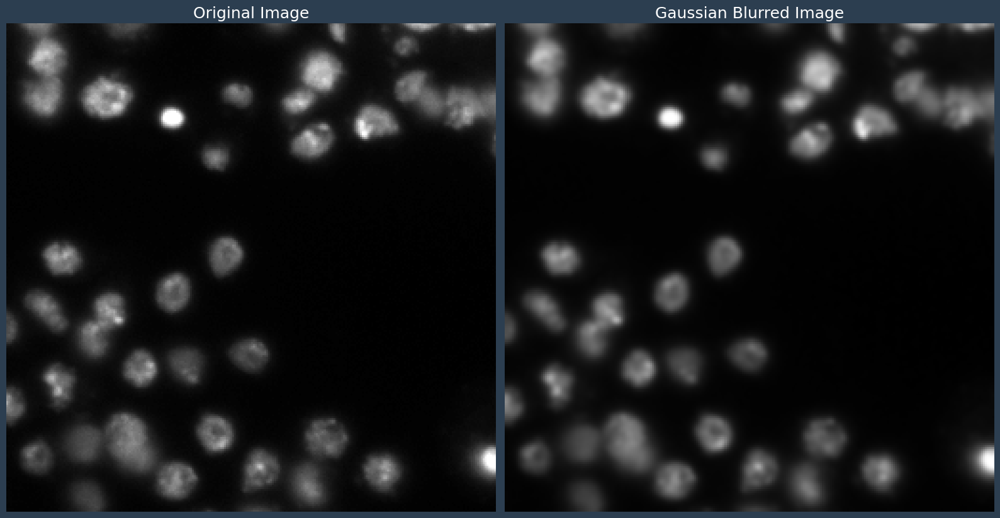

In [2]:
# Gaussian Blur

import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load the image (make sure 'Test.png' is in your working directory)
image = cv2.imread('Test.png')
if image is None:
    raise FileNotFoundError("Test.png not found. Please check the file path.")

# Convert the image from BGR (OpenCV default) to RGB for proper color display
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Apply Gaussian Blur with a kernel of (5,5). You can adjust the sigma value as needed.
blurred_image = cv2.GaussianBlur(image, (5, 5), 0)
blurred_image_rgb = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB)

# Set up the figure with an attractive dark blue background.
fig = plt.figure(figsize=(16, 9), facecolor='#2C3E50')  # Dark blue figure background

# Create the first subplot for the original image.
ax1 = plt.subplot(1, 2, 1)
ax1.imshow(image_rgb)
ax1.set_title("Original Image", fontsize=18, color='white')
ax1.axis("off")
ax1.set_facecolor('#34495E')  # Slightly lighter dark blue for the axis background

# Create the second subplot for the blurred image.
ax2 = plt.subplot(1, 2, 2)
ax2.imshow(blurred_image_rgb)
ax2.set_title("Gaussian Blurred Image", fontsize=18, color='white')
ax2.axis("off")
ax2.set_facecolor('#34495E')

plt.tight_layout()
plt.show()

In [57]:
import tensorflow as tf
print(tf.sysconfig.get_build_info())

OrderedDict([('cpu_compiler', 'C:/Program Files (x86)/Microsoft Visual Studio/2019/Community/VC/Tools/MSVC/14.29.30133/bin/HostX64/x64/cl.exe'), ('cuda_compute_capabilities', ['sm_35', 'sm_50', 'sm_60', 'sm_70', 'sm_75', 'compute_80']), ('cuda_version', '64_112'), ('cudart_dll_name', 'cudart64_112.dll'), ('cudnn_dll_name', 'cudnn64_8.dll'), ('cudnn_version', '64_8'), ('is_cuda_build', True), ('is_rocm_build', False), ('is_tensorrt_build', False), ('msvcp_dll_names', 'msvcp140.dll,msvcp140_1.dll'), ('nvcuda_dll_name', 'nvcuda.dll')])


In [58]:
import tensorflow as tf
print(tf.__version__)

2.10.1


In [59]:
import tensorflow as tf

# Perform a large operation
print(tf.reduce_sum(tf.random.normal([10000, 10000])))

tf.Tensor(1242.9716, shape=(), dtype=float32)


In [60]:
import tensorflow as tf

tf.debugging.set_log_device_placement(True)

# Perform a simple operation
a = tf.constant([[1.0, 2.0]])
b = tf.constant([[3.0], [4.0]])
c = tf.matmul(a, b)

print(c)

tf.Tensor([[11.]], shape=(1, 1), dtype=float32)


In [61]:
import tensorflow as tf
print("Available GPUs:", tf.config.list_physical_devices('GPU'))

Available GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [62]:
# Starting with U-Net

import tensorflow as tf

IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNEL = 3

# Build the model

# Encoding/contraction
# Create tensor to hold the input image
# First block of U-Net
inputs = tf.keras.layers.Input((IMG_WIDTH,IMG_HEIGHT,IMG_CHANNEL))

# Create Conv layer object and call the __call__ method with (inputs) as argument 
c1 = tf.keras.layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)

# Add some drop out for regularization
c1 = tf.keras.layers.Dropout(0.1)(c1)

# Keras layers only accept floating value but pixels are integer, so it internally converts the input into float32

# Check data types
print("Input dtype:", inputs.dtype)  # float32 due to keras
print("Output dtype:", c1.dtype)    # float32

# 2nd Conv Layer
c1 = tf.keras.layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)

# Max-Pooling Layer with kernel size (2,2) and stride 2 by default
p1 = tf.keras.layers.MaxPooling2D((2,2))(c1)

Input dtype: <dtype: 'float32'>
Output dtype: <dtype: 'float32'>


In [63]:
# Second block of U-Net
c2 = tf.keras.layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)

# Add some drop out for regularization
c2 = tf.keras.layers.Dropout(0.1)(c2)

# 2nd Conv Layer
c2 = tf.keras.layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)

# Max-Pooling Layer
p2 = tf.keras.layers.MaxPooling2D((2,2))(c2)

In [64]:
# Third block of U-Net
c3 = tf.keras.layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)

# Add some drop out for regularization
c3 = tf.keras.layers.Dropout(0.2)(c3)

# 2nd Conv Layer
c3 = tf.keras.layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)

# Max-Pooling Layer
p3 = tf.keras.layers.MaxPooling2D((2,2))(c3)

In [65]:
# Forth block of U-Net
c4 = tf.keras.layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)

# Add some drop out for regularization
c4 = tf.keras.layers.Dropout(0.2)(c4)

# 2nd Conv Layer
c4 = tf.keras.layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)

# Max-Pooling Layer
p4 = tf.keras.layers.MaxPooling2D((2,2))(c4)

In [66]:
# Fifth block of U-Net
c5 = tf.keras.layers.Conv2D(256, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)

# Add some drop out for regularization
c5 = tf.keras.layers.Dropout(0.3)(c5)

# 2nd Conv Layer
c5 = tf.keras.layers.Conv2D(256, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

# Shape after final Conv2D
print(c5.shape)

(None, 16, 16, 256)


In [67]:
# After the final Conv2D the output shape will be (8,8,256)

# Decoding/Expansion

# Sixth block of U-Net
# Conv2DTranspose with kernel (2,2) and strides (2,2) 
# Upsamples the feature map by 2x in both height and width
u6 = tf.keras.layers.Conv2DTranspose(128, (2,2), strides=(2,2), padding='same')(c5)

# Concatenation 
u6 = tf.keras.layers.concatenate([u6, c4])

# 1nd Conv Layer 
c6 = tf.keras.layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)

# Add some drop out for regularization
c6 = tf.keras.layers.Dropout(0.2)(c6)

# 2nd Conv Layer
c6 = tf.keras.layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

In [68]:
# Seventh block of U-Net

# Conv2DTranspose with kernel (2,2) and strides (2,2) 
# Upsamples the feature map by 2x in both height and width
u7 = tf.keras.layers.Conv2DTranspose(64, (2,2), strides=(2,2), padding='same')(c6)

# Concatenation 
u7 = tf.keras.layers.concatenate([u7, c3])

# 1nd Conv Layer 
c7 = tf.keras.layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)

# Add some drop out for regularization
c7 = tf.keras.layers.Dropout(0.2)(c7)

# 2nd Conv Layer
c7 = tf.keras.layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

In [69]:
# Eight block of U-Net

# Conv2DTranspose with kernel (2,2) and strides (2,2) 
# Upsamples the feature map by 2x in both height and width
u8 = tf.keras.layers.Conv2DTranspose(32, (2,2), strides=(2,2), padding='same')(c7)

# Concatenation 
u8 = tf.keras.layers.concatenate([u8, c2])

# 1nd Conv Layer 
c8 = tf.keras.layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)

# Add some drop out for regularization
c8 = tf.keras.layers.Dropout(0.1)(c8)

# 2nd Conv Layer
c8 = tf.keras.layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

In [70]:
# Ninth block of U-Net

# Conv2DTranspose with kernel (2,2) and strides (2,2) 
# Upsamples the feature map by 2x in both height and width
u9 = tf.keras.layers.Conv2DTranspose(16, (2,2), strides=(2,2), padding='same')(c8)

# Concatenation 
u9 = tf.keras.layers.concatenate([u9, c1], axis=3) # Concatenate the channel axis (N,H,W,C) Rank 4 tensor; Batch_Size, Height, Width, Channel

# 1nd Conv Layer 
c9 = tf.keras.layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)

# Add some drop out for regularization
c9 = tf.keras.layers.Dropout(0.1)(c9)

# 2nd Conv Layer
c9 = tf.keras.layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)


In [71]:
# Define IoU metric
def iou_metric(y_true, y_pred):
  # Convert predictions to binary values using threshold of 0.5
  y_pred = tf.cast(y_pred > 0.5, tf.float32)
  
  # Calculate intersection and union
  intersection = tf.reduce_sum(y_true * y_pred)
  union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
  
  # Add small epsilon to avoid division by zero
  iou = (intersection + 1e-7) / (union + 1e-7)
  return iou

In [72]:
# Output Layer
outputs = tf.keras.layers.Conv2D(1,(1,1), activation='sigmoid')(c9)

# Compile the model
model = tf.keras.Model(inputs=[inputs],outputs=[outputs])
model.compile(optimizer='adam',loss='binary_crossentropy', metrics=['accuracy', iou_metric])
model.summary()

Model: "model_34"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_19 (Conv2D)             (None, 256, 256, 16  448         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_9 (Dropout)            (None, 256, 256, 16  0           ['conv2d_19[0][0]']              
                                )                                                          

In [73]:
# Load tensorboard
%load_ext tensorboard

# Import time
import datetime

# Log file directory
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

# Tb callback
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [74]:
# Implementation of callbacks
# Modelcheckpoint

checkpointer = tf.keras.callbacks.ModelCheckpoint('model_for_nuclei.h5', verbose=1, save_best_only=True, save_weights_only=False)

callbacks = [
  # tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'), # If 2 iteration of val_loss is same then stop the further epochs
  tensorboard_callback
]

### Understanding our dataset

[Data Link](https://www.kaggle.com/competitions/data-science-bowl-2018/data)

The provided dataset contains `train` and `test`. The `test` data is go to go but, theirs an issue with the `training` data. In the `mask` folder their's masking for every nuclei. Instead of a single image of the segmented mask their is segmented image for every nuclei. 

Therefore, we need to perform preprocessing before we train the model. 

In [75]:
# Image preprocessing for Assignment

import os
import numpy as np
import cv2 as cv

from tqdm import tqdm

from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt

TRAIN_PATH = './Nuclei_Dataset/stage1_train'
TEST_PATH = './Nuclei_Dataset/stage1_test/'

MASK_NAME = '/Final_mask_'

train_ids = next(os.walk(TRAIN_PATH))[1] # All folders for train
test_ids = next(os.walk(TEST_PATH))[1] # All folders for test

# RandomForestTraining
# X_train = np.zeros((5, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNEL), dtype=np.uint8) # Input
# Y_train = np.zeros((5, IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool_) # Output only one channel

# U-Net Training
X_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNEL), dtype=np.uint8) # Input
Y_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool_) # Output only one channel

img_count = 0

# Resize and processing for training data
for n, id_ in tqdm(enumerate(train_ids),total=len(train_ids)):
  
  path = TRAIN_PATH + '/' + id_
  img = imread(path + '/images/' + id_ + '.png')[:,:,:IMG_CHANNEL] # Read all the 3 channels
  img = resize(img,(IMG_HEIGHT,IMG_WIDTH), mode='constant', preserve_range=True)

  # print(img.shape)

  mask_path = path + MASK_NAME + id_ + '/' + id_ + '.png'

  # print(path + MASK_NAME + id_ + '/' + id_ + '.png')

  X_train[n] = img

  mask_ = imread(mask_path)
  mask_ = np.expand_dims(resize(mask_, (IMG_HEIGHT,IMG_WIDTH), mode='constant', preserve_range=True), axis=-1)

  Y_train[n] = mask_ 

  img_count += 1

  # if img_count == 5:
  #   break

100%|██████████| 670/670 [00:47<00:00, 14.16it/s]


In [76]:
print(X_train.shape, Y_train.shape)

(670, 256, 256, 3) (670, 256, 256, 1)


(256, 256, 1)
(670, 256, 256, 3)


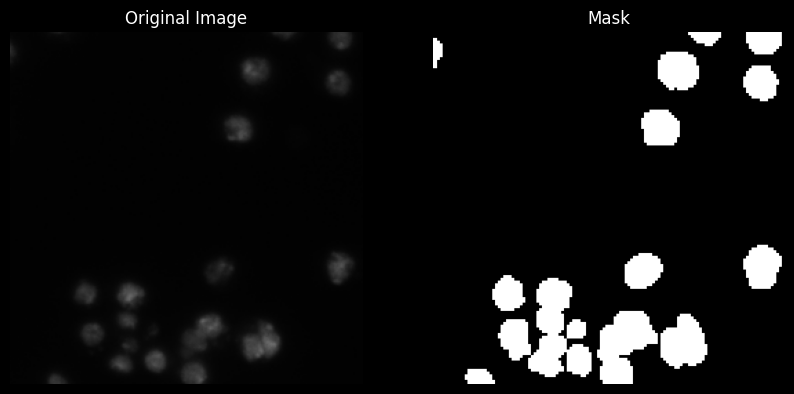

In [77]:
# Display some random img

for img, mask in zip(X_train, Y_train):
  # Create a figure with two subplots side by side

  print(mask.shape)
  print(X_train.shape)
  plt.figure(figsize=(10, 5))

  # Convert BGR to RGB for matplotlib
  img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

  # Display original image
  plt.subplot(1, 2, 1)
  plt.imshow(img_rgb)  # Now using RGB image
  plt.title('Original Image')
  plt.axis('off')

  # Display mask
  plt.subplot(1, 2, 2)
  plt.imshow(np.squeeze(mask), cmap='gray')  # Mask remains unchanged as it's grayscale
  plt.title('Mask')
  plt.axis('off')

  plt.show()
  break

The above process using `NumPy` did not perform well. It will take a longer time to process the image. Therefore, we can plot these image as tensors using `tf` and then process.

**Point to be Noted**

First, research why `NumPy` are slower as compared to `Tensors`. Understand the under the hood processing of `NumPy`.

Try to improve the performance of `NumPy` if possible, else use `tensors`. 

In the above task it's taking way too long to resize and add the images to the `initialized 4-D tensor` i.e. `X_train` with shape `(670,128,128,3)`. 

In [78]:
# Resize and processing for test data
X_test = np.zeros((len(test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNEL), dtype=np.uint8)
sizes_test = []

print("Resizing test images")

for n, id_ in tqdm(enumerate(test_ids), total=len(test_ids)):
    path = TEST_PATH + '/' + id_
    img = imread(path + '/images/' + id_ + '.png')[:,:,:IMG_CHANNEL]
    sizes_test.append([img.shape[0], img.shape[1]])
    img = resize(img, (IMG_HEIGHT,IMG_WIDTH), mode='constant', preserve_range=True)
    X_test[n] = img

Resizing test images


100%|██████████| 65/65 [00:03<00:00, 18.88it/s]


C:\Users\Acer\AppData\Local\Temp\ipykernel_9840\2640930266.py:14: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  imshow(X_train[image_x])
C:\Users\Acer\AppData\Local\Temp\ipykernel_9840\2640930266.py:20: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  imshow(np.squeeze(Y_train[image_x]))  # Convert boolean to uint8 (0 or 255)


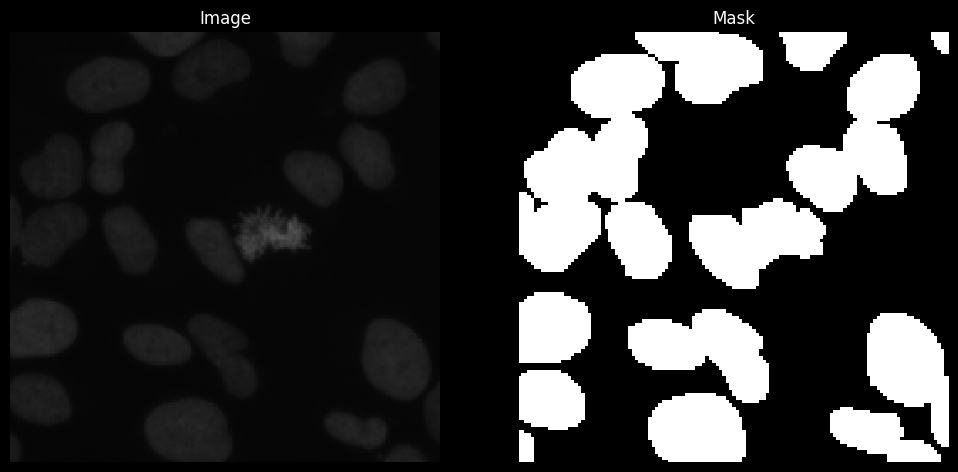

In [79]:
# Display some random image after preprocessing

import random
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imshow

# Randomly select an image index
image_x = random.randint(0, len(train_ids) - 1)

# Display the image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)  # Create a subplot with 1 row, 2 columns, position 1
imshow(X_train[image_x])
plt.title("Image")
plt.axis('off')

# Display the mask (converted to uint8 for proper visualization)
plt.subplot(1, 2, 2)  # Create a subplot with 1 row, 2 columns, position 2
imshow(np.squeeze(Y_train[image_x]))  # Convert boolean to uint8 (0 or 255)
plt.title("Mask")
plt.axis('off')

plt.show()

In [80]:
# Model Fit
result = model.fit(
  X_train, 
	Y_train, 
	validation_split=0.1,
	batch_size=16,
  epochs=50,
  callbacks=callbacks
  )

Epoch 1/50
38/38 [==============================] - 16s 270ms/step - loss: 1.8585 - accuracy: 0.6069 - iou_metric: 0.2108 - val_loss: 0.6474 - val_accuracy: 0.8243 - val_iou_metric: 0.2135
Epoch 2/50
38/38 [==============================] - 7s 173ms/step - loss: 0.6513 - accuracy: 0.8042 - iou_metric: 0.3670 - val_loss: 0.6059 - val_accuracy: 0.8620 - val_iou_metric: 0.3948
Epoch 3/50
38/38 [==============================] - 7s 175ms/step - loss: 0.4452 - accuracy: 0.8866 - iou_metric: 0.5900 - val_loss: 0.2576 - val_accuracy: 0.9152 - val_iou_metric: 0.6386
Epoch 4/50
38/38 [==============================] - 7s 175ms/step - loss: 0.2788 - accuracy: 0.8995 - iou_metric: 0.6168 - val_loss: 0.3155 - val_accuracy: 0.9105 - val_iou_metric: 0.5806
Epoch 5/50
38/38 [==============================] - 7s 173ms/step - loss: 0.2156 - accuracy: 0.9226 - iou_metric: 0.7008 - val_loss: 0.1892 - val_accuracy: 0.9316 - val_iou_metric: 0.7032
Epoch 6/50
38/38 [==============================] - 7s 180m

In [25]:
# Save the U-Net Model 

model.save('final_unet_model.h5')

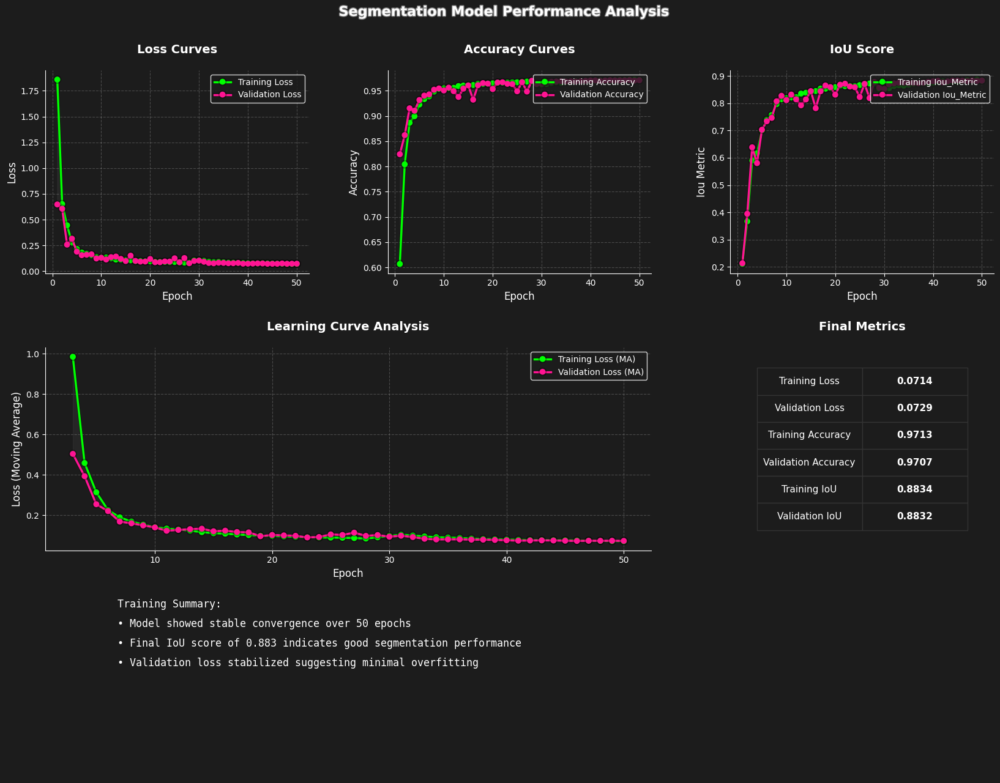

In [81]:
# Performance metrics visualization U-Net

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch
import matplotlib.patheffects as path_effects

def create_gradient_plot(ax, x, y1, y2, color1, color2, label1, label2):
    """Create a gradient-filled plot between two curves"""
    ax.fill_between(x, y1, y2, color='gray', alpha=0.1)
    line1 = ax.plot(x, y1, color=color1, label=label1, linewidth=2.5, marker='o', markersize=6)
    line2 = ax.plot(x, y2, color=color2, label=label2, linewidth=2.5, marker='o', markersize=6)
    
    # Add glow effect to lines
    for line in [line1[0], line2[0]]:
        line.set_path_effects([
            path_effects.Stroke(linewidth=4, foreground='black', alpha=0.3),
            path_effects.Normal()
        ])

def style_ax(ax, title, xlabel, ylabel):
    """Apply consistent styling to axis"""
    ax.set_title(title, fontsize=14, pad=20, color='white', 
                fontweight='bold', fontfamily='sans-serif')
    ax.set_xlabel(xlabel, fontsize=12, color='white')
    ax.set_ylabel(ylabel, fontsize=12, color='white')
    ax.grid(True, linestyle='--', alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.tick_params(colors='white')

def plot_advanced_metrics(history):
    """
    Create an advanced visualization of training metrics with modern styling
    """
    # Set style
    plt.style.use('dark_background')
    
    # Custom color palette
    colors = {
        'primary': '#00ff00',
        'secondary': '#ff1493',
        'accent': '#00ffff',
        'background': '#1C1C1C',
        'grid': '#333333'
    }
    
    # Create figure with custom layout
    fig = plt.figure(figsize=(20, 15), facecolor=colors['background'])
    gs = GridSpec(3, 3, figure=fig, height_ratios=[2, 2, 1.5], hspace=0.4, wspace=0.3)
    
    # 1. Main Metrics Plots
    metrics = ['loss', 'accuracy', 'iou_metric']
    titles = ['Loss Curves', 'Accuracy Curves', 'IoU Score']
    
    for idx, metric in enumerate(metrics):
        ax = fig.add_subplot(gs[0, idx])
        ax.set_facecolor(colors['background'])
        
        create_gradient_plot(
            ax,
            range(1, len(history.history[metric]) + 1),
            history.history[metric],
            history.history[f'val_{metric}'],
            colors['primary'],
            colors['secondary'],
            f'Training {metric.title()}',
            f'Validation {metric.title()}'
        )
        
        style_ax(ax, titles[idx], 'Epoch', metric.replace('_', ' ').title())
        ax.legend(loc='upper right', facecolor=colors['background'], edgecolor='white')

    # 2. Learning Curve Analysis
    ax_learning = fig.add_subplot(gs[1, :2])
    ax_learning.set_facecolor(colors['background'])
    
    # Calculate moving averages
    window = 3
    train_ma = pd.Series(history.history['loss']).rolling(window=window).mean()
    val_ma = pd.Series(history.history['val_loss']).rolling(window=window).mean()
    
    create_gradient_plot(
        ax_learning,
        range(1, len(history.history['loss']) + 1),
        train_ma,
        val_ma,
        colors['primary'],
        colors['secondary'],
        'Training Loss (MA)',
        'Validation Loss (MA)'
    )
    
    style_ax(ax_learning, 'Learning Curve Analysis', 'Epoch', 'Loss (Moving Average)')
    ax_learning.legend(loc='upper right', facecolor=colors['background'], edgecolor='white')

    # 3. Final Metrics Table with Modern Design
    ax_metrics = fig.add_subplot(gs[1, 2])
    ax_metrics.set_facecolor(colors['background'])
    
    final_metrics = {
        'Training Loss': f"{history.history['loss'][-1]:.4f}",
        'Validation Loss': f"{history.history['val_loss'][-1]:.4f}",
        'Training Accuracy': f"{history.history['accuracy'][-1]:.4f}",
        'Validation Accuracy': f"{history.history['val_accuracy'][-1]:.4f}",
        'Training IoU': f"{history.history['iou_metric'][-1]:.4f}",
        'Validation IoU': f"{history.history['val_iou_metric'][-1]:.4f}"
    }
    
    # Create modern-looking table
    cell_text = [[k, v] for k, v in final_metrics.items()]
    table = ax_metrics.table(
        cellText=cell_text,
        cellLoc='center',
        loc='center',
        bbox=[0.1, 0.1, 0.8, 0.8]
    )
    
    # Style table
    table.auto_set_font_size(False)
    table.set_fontsize(11)
    for k, cell in table._cells.items():
        cell.set_edgecolor(colors['grid'])
        cell.set_facecolor(colors['background'])
        cell.set_text_props(color='white')
        if k[1] == 1:  # Value cells
            cell.set_text_props(weight='bold')
    
    ax_metrics.set_title('Final Metrics', pad=20, color='white', fontsize=14, fontweight='bold')
    ax_metrics.axis('off')

    # 4. Training Summary
    ax_summary = fig.add_subplot(gs[2, :])
    ax_summary.set_facecolor(colors['background'])
    ax_summary.axis('off')
    
    summary_text = """
    Training Summary:
    • Model showed {convergence} convergence over {epochs} epochs
    • Final IoU score of {iou:.3f} indicates {performance} segmentation performance
    • Validation loss {loss_trend} suggesting {overfitting}
    """.format(
        convergence = 'stable' if history.history['val_loss'][-1] < history.history['val_loss'][0] else 'unstable',
        epochs = len(history.history['loss']),
        iou = history.history['val_iou_metric'][-1],
        performance = 'good' if history.history['val_iou_metric'][-1] > 0.7 else 'moderate' if history.history['val_iou_metric'][-1] > 0.5 else 'poor',
        loss_trend = 'stabilized' if abs(history.history['val_loss'][-1] - history.history['val_loss'][-2]) < 0.01 else 'is still changing',
        overfitting = 'minimal overfitting' if history.history['val_loss'][-1] < 1.2 * min(history.history['val_loss']) else 'potential overfitting'
    )
    
    ax_summary.text(0.05, 0.6, summary_text, fontsize=12, color='white', 
                   fontfamily='monospace', linespacing=2)

    # Main title with style
    title = fig.suptitle('Segmentation Model Performance Analysis', 
                        fontsize=16, color='white', fontweight='bold', y=0.95)
    title.set_path_effects([path_effects.withStroke(linewidth=2, foreground='gray')])

    plt.show()

# Call the function
plot_advanced_metrics(result)

In [ ]:
# Filter visualization 5 Layers of U-Net

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import seaborn as sns

def visualize_filters(model, layer_name, max_filters=64):
    """
    Visualize filters from a specific convolutional layer
    """
    # Get the layer
    layer = model.get_layer(layer_name)
    weights, biases = layer.get_weights()
    
    # Normalize weights for better visualization
    weights_min, weights_max = weights.min(), weights.max()
    weights = (weights - weights_min) / (weights_max - weights_min)
    
    # Get number of filters and channels
    n_filters, n_channels = weights.shape[3], weights.shape[2]
    n_filters = min(n_filters, max_filters)  # Limit number of filters to display
    
    # Create figure with dark background
    plt.style.use('dark_background')
    fig = plt.figure(figsize=(20, 10), facecolor='#1C1C1C')
    
    # Calculate grid dimensions
    grid_size = int(np.ceil(np.sqrt(n_filters)))
    
    # Create ImageGrid
    grid = ImageGrid(fig, 111,
                    nrows_ncols=(grid_size, grid_size),
                    axes_pad=0.3,
                    share_all=True)
    
    # Plot filters
    for idx in range(n_filters):
        # Get the filter
        filt = weights[:, :, :, idx]
        
        # Create RGB image by combining channels
        if n_channels == 3:
            img = filt
        else:
            img = np.mean(filt, axis=2)
        
        # Add filter to grid
        im = grid[idx].imshow(img, cmap='viridis')
        grid[idx].axis('off')
        
        # Add colorbar
        if idx == n_filters - 1:
            cbar = plt.colorbar(im, ax=grid.axes_all)
            cbar.ax.set_ylabel('Filter Values', color='white')
            cbar.ax.yaxis.set_tick_params(color='white')
            plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='white')
    
    plt.suptitle(f'Filters in {layer_name}', color='white', fontsize=16, y=0.95)
    plt.show()

def plot_layer_activations(model, layer_name):
    """
    Plot the distribution of weights and biases for a layer
    """
    layer = model.get_layer(layer_name)
    weights, biases = layer.get_weights()
    
    plt.style.use('dark_background')
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), facecolor='#1C1C1C')
    fig.patch.set_facecolor('#1C1C1C')
    
    # Plot weight distribution
    sns.kdeplot(weights.ravel(), ax=ax1, color='#00ff00', fill=True, alpha=0.5)
    ax1.set_title('Weight Distribution', color='white', pad=20)
    ax1.set_xlabel('Weight Value', color='white')
    ax1.set_ylabel('Density', color='white')
    ax1.tick_params(colors='white')
    
    # Plot bias distribution
    sns.kdeplot(biases.ravel(), ax=ax2, color='#ff1493', fill=True, alpha=0.5)
    ax2.set_title('Bias Distribution', color='white', pad=20)
    ax2.set_xlabel('Bias Value', color='white')
    ax2.set_ylabel('Density', color='white')
    ax2.tick_params(colors='white')
    
    plt.suptitle(f'Weight and Bias Distributions for {layer_name}', color='white', fontsize=16, y=1.05)
    plt.tight_layout()
    plt.show()

def visualize_model_weights():
    """
    Visualize weights for multiple layers of the model
    """
    # List of conv layers to visualize
    conv_layers = [layer.name for layer in model.layers if 'conv2d' in layer.name][:6]  # First 6 conv layers
    
    print("Visualizing filters and weights for key layers...")
    
    for layer_name in conv_layers:
        print(f"\nAnalyzing {layer_name}...")
        
        # Visualize filters
        visualize_filters(model, layer_name)
        
        # Plot weight and bias distributions
        plot_layer_activations(model, layer_name)
        
        # Add separator
        print("-" * 80)

# Call the visualization function
visualize_model_weights()

# Additional analysis of model architecture
def plot_layer_sizes():
    """
    Plot the number of parameters per layer
    """
    plt.style.use('dark_background')
    fig = plt.figure(figsize=(15, 8), facecolor='#1C1C1C')
    ax = fig.add_subplot(111)
    ax.set_facecolor('#1C1C1C')
    
    # Get layer names and parameters
    layer_names = [layer.name for layer in model.layers if len(layer.get_weights()) > 0]
    params = [np.sum([w.size for w in layer.get_weights()]) for layer in model.layers if len(layer.get_weights()) > 0]
    
    # Create bar plot
    bars = ax.bar(range(len(layer_names)), params, color='#00ff00', alpha=0.7)
    
    # Customize plot
    ax.set_xticks(range(len(layer_names)))
    ax.set_xticklabels(layer_names, rotation=45, ha='right')
    ax.set_yscale('log')
    ax.set_ylabel('Number of Parameters (log scale)', color='white')
    ax.set_title('Model Layer Sizes', color='white', pad=20)
    ax.tick_params(colors='white')
    
    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height):,}',
                ha='center', va='bottom', color='white', rotation=0)
    
    plt.tight_layout()
    plt.show()

# Plot layer sizes
plot_layer_sizes()

21/21 [==============================] - 2s 90ms/step


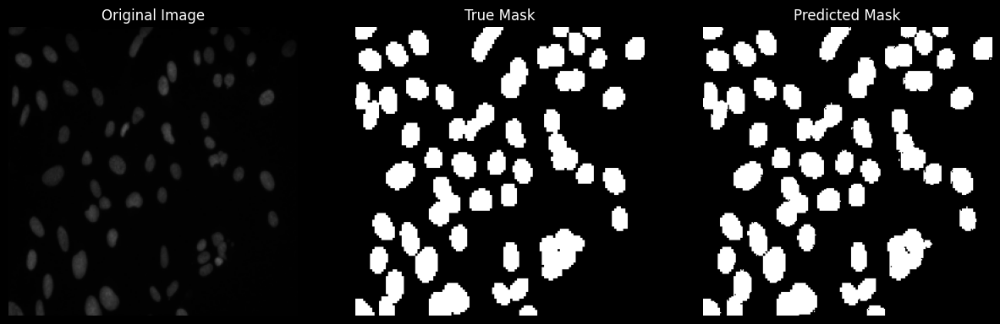

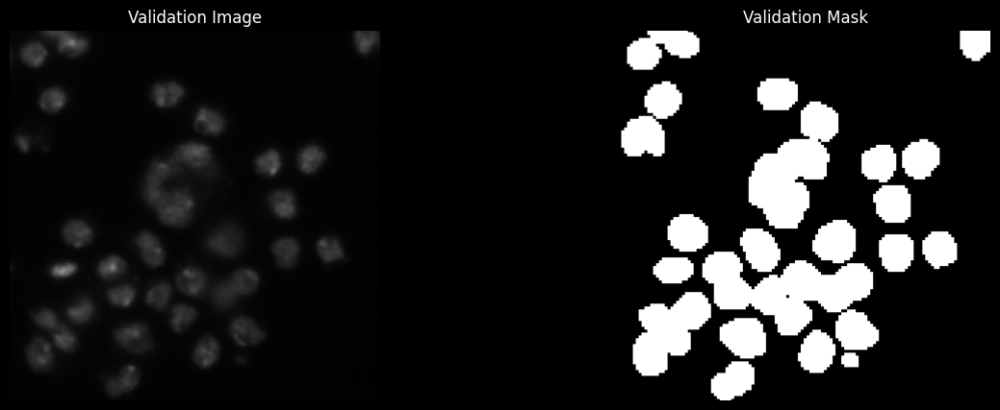

Validation set size: 67
Random index selected: 43


In [82]:
# Model Test with Random Image

idx = random.randint(0, len(X_train)-1)

loaded_model = tf.keras.models.load_model(
    'final_unet_model.h5',
    custom_objects={'iou_metric': iou_metric}
)

preds_train = loaded_model.predict(X_train[:int(X_train.shape[0]*0.9)], verbose=1)
preds_val = loaded_model.predict(X_train[:int(X_train.shape[0]*0.9):], verbose=1)
preds_test = loaded_model.predict(X_train, verbose=1)

# Convert predictions to binary masks
prest_train_t = (preds_train > 0.5).astype(np.uint8)
prest_val_t = (preds_val > 0.5).astype(np.uint8)
prest_test_t = (preds_test > 0.5).astype(np.uint8)

# Random training samples
ix = random.randint(0, len(prest_test_t))

# Display with matplotlib
plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.imshow(X_train[ix])
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(np.squeeze(Y_train[ix]), cmap='gray')
plt.title('True Mask')
plt.axis('off')

plt.subplot(133)
plt.imshow(np.squeeze(prest_test_t[ix]), cmap='gray')
plt.title('Predicted Mask')
plt.axis('off')

plt.show()

# Display with OpenCV (corrected version)
# Scale the prediction to proper range for visualization
prediction = np.squeeze(prest_test_t[ix])  # Remove extra dimensions
prediction = (prediction * 255).astype(np.uint8)  # Scale to 0-255 range

# Create a window
cv.namedWindow("Prediction", cv.WINDOW_NORMAL)
cv.resizeWindow("Prediction", 512, 512)  # Set window size

# Show the image
cv.imshow("Prediction", prediction)
cv.waitKey(0)
cv.destroyAllWindows()

# For validation samples
split_idx = int(X_train.shape[0]*0.9)
X_val = X_train[split_idx:]
Y_val = Y_train[split_idx:]

# Random validation samples
ix = random.randint(0, len(X_val) - 1)

# Display validation images
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(X_val[ix])
plt.title('Validation Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(np.squeeze(Y_val[ix]), cmap='gray')
plt.title('Validation Mask')
plt.axis('off')

plt.show()

print(f"Validation set size: {len(X_val)}")
print(f"Random index selected: {ix}")

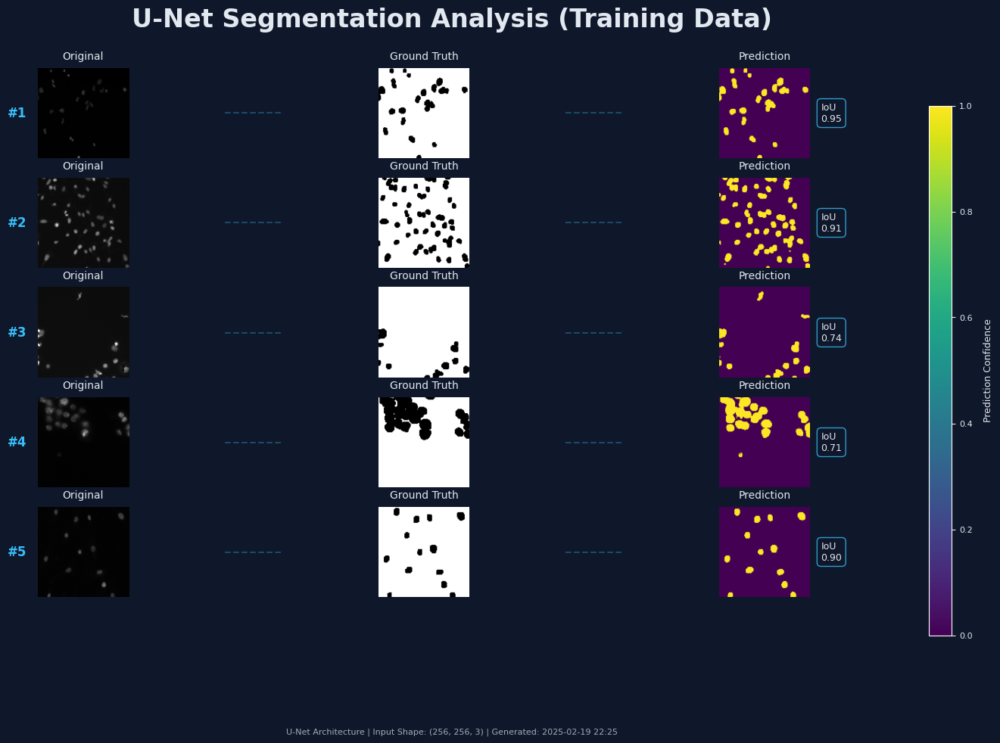

In [83]:
# U-Net Prediction Testing Data 5 Images 

def create_unet_train_visualization(model, X_train, Y_train, n_samples=5, figsize=(15, 10)):
    """
    Create an attractive visualization of U-Net segmentation predictions on training data
    with black and white ground truth masks
    """
    # Style constants
    BACKGROUND_COLOR = '#0f172a'  # Dark blue background
    TEXT_COLOR = '#e2e8f0'       # Light gray text
    ACCENT_COLOR = '#38bdf8'     # Light blue accent
    
    # Set style
    plt.style.use('dark_background')
    
    # Select random indices
    indices = np.random.choice(len(X_train), n_samples, replace=False)
    
    # Create figure
    fig = plt.figure(figsize=figsize, facecolor=BACKGROUND_COLOR)
    
    # Add title
    fig.suptitle('U-Net Segmentation Analysis (Training Data)',
                 color=TEXT_COLOR,
                 fontsize=24,
                 fontweight='bold',
                 y=0.98)
    
    # Get predictions
    raw_predictions = model.predict(X_train[indices], verbose=0)
    predictions = (raw_predictions > 0.5).astype(np.uint8)
    
    # Create layout
    for idx in range(n_samples):
        # Calculate positions for images
        y_pos = 0.78 - (idx * 0.145)
        
        # Original image - left
        ax1 = fig.add_axes([0.05, y_pos, 0.25, 0.12])
        ax1.imshow(X_train[indices[idx]])
        ax1.axis('off')
        ax1.set_title("Original", fontsize=10, color=TEXT_COLOR, pad=8)
        
        # Add case number
        ax1.text(-0.12, 0.5, f'#{idx+1}',
                transform=ax1.transAxes,
                color=ACCENT_COLOR,
                fontsize=12,
                fontweight='bold',
                ha='right',
                va='center')
        
        # Ground truth mask - middle (black and white)
        ax2 = fig.add_axes([0.35, y_pos, 0.25, 0.12])
        ax2.imshow(np.squeeze(Y_train[indices[idx]]), cmap='binary', vmin=0, vmax=1)
        ax2.axis('off')
        ax2.set_title("Ground Truth", fontsize=10, color=TEXT_COLOR, pad=8)
        
        # Prediction - right
        ax3 = fig.add_axes([0.65, y_pos, 0.25, 0.12])
        pred_img = np.squeeze(predictions[idx])
        im = ax3.imshow(pred_img, cmap='viridis')
        ax3.axis('off')
        ax3.set_title("Prediction", fontsize=10, color=TEXT_COLOR, pad=8)
        
        # Calculate IoU score
        intersection = np.logical_and(Y_train[indices[idx]], predictions[idx])
        union = np.logical_or(Y_train[indices[idx]], predictions[idx])
        iou_score = np.sum(intersection) / np.sum(union)
        
        # Add IoU score box
        ax3.text(1.12, 0.5,
                f'IoU\n{iou_score:.2f}',
                transform=ax3.transAxes,
                color=TEXT_COLOR,
                fontsize=9,
                ha='left',
                va='center',
                bbox=dict(facecolor=BACKGROUND_COLOR, 
                         alpha=0.8,
                         edgecolor=ACCENT_COLOR,
                         boxstyle='round,pad=0.4'))
        
        # Add connecting lines
        con_line1 = plt.Line2D([0.30, 0.35], [y_pos + 0.06, y_pos + 0.06],
                              color=ACCENT_COLOR,
                              alpha=0.3,
                              transform=fig.transFigure,
                              linestyle='--')
        con_line2 = plt.Line2D([0.60, 0.65], [y_pos + 0.06, y_pos + 0.06],
                              color=ACCENT_COLOR,
                              alpha=0.3,
                              transform=fig.transFigure,
                              linestyle='--')
        fig.add_artist(con_line1)
        fig.add_artist(con_line2)
    
    # Add colorbar (only for prediction confidence)
    cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    cbar = plt.colorbar(im, cax=cax)
    cbar.set_label('Prediction Confidence',
                   color=TEXT_COLOR,
                   fontsize=9,
                   labelpad=10)
    cbar.ax.tick_params(colors=TEXT_COLOR, labelsize=8)
    
    # Add footer with model info
    footer_text = (f'U-Net Architecture | Input Shape: {X_train.shape[1:]} | '
                  f'Generated: {datetime.datetime.now().strftime("%Y-%m-%d %H:%M")}')
    plt.figtext(0.5, 0.02,
                footer_text,
                color=TEXT_COLOR,
                fontsize=8,
                ha='center',
                alpha=0.7)
    
    # Adjust layout
    plt.subplots_adjust(top=0.92, bottom=0.01, right=0.90, left=0.05)
    
    return fig

# Import required libraries
import numpy as np
import matplotlib.pyplot as plt
import datetime

# Create and display visualization
fig = create_unet_train_visualization(model, X_train, Y_train)

# Optionally save the visualization
# plt.savefig('unet_train_predictions.png',
#             facecolor='#0f172a',
#             bbox_inches='tight',
#             dpi=300)

plt.show()


Calculating prediction times over 3 runs...


Run 3/3: 100%|██████████████████████████████████████████████████████| 65/65 [00:06<00:00, 10.58it/s]



Prediction Time Analysis:
Average time per image: 94.01 ms
Standard deviation: 9.26 ms
Total time for 65 images: 18.33 seconds


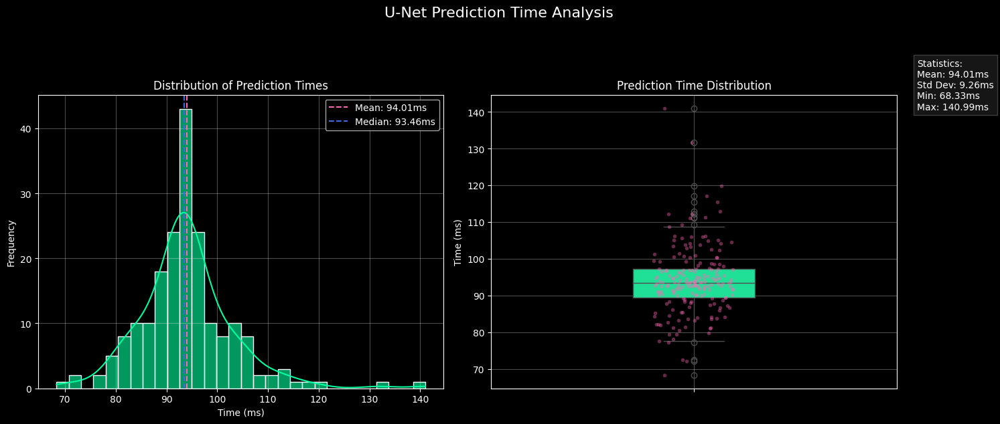

In [84]:
# U-Net Time Per Image Prediction

import time
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

def calculate_prediction_time(model, X_test, num_runs=3):
    """
    Calculate average prediction time per image using X_test data
    Args:
        model: Trained U-Net model
        X_test: Test dataset
        num_runs: Number of times to run predictions for averaging
    Returns:
        avg_time_per_image: Average time per image in milliseconds
        std_time_per_image: Standard deviation of prediction time
        total_time: Total time taken for all predictions
    """
    print(f"\nCalculating prediction times over {num_runs} runs...")
    all_times = []
    
    for run in range(num_runs):
        times = []
        with tqdm(total=len(X_test), desc=f"Run {run+1}/{num_runs}", ncols=100) as pbar:
            for i in range(len(X_test)):
                # Get single image
                img = X_test[i:i+1]
                
                # Time prediction
                start_time = time.time()
                _ = model.predict(img, verbose=0)
                end_time = time.time()
                
                # Store time in milliseconds
                pred_time = (end_time - start_time) * 1000
                times.append(pred_time)
                pbar.update(1)
        
        all_times.extend(times)
    
    # Calculate statistics
    avg_time = np.mean(all_times)
    std_time = np.std(all_times)
    total_time = np.sum(all_times)
    
    # Print results
    print("\nPrediction Time Analysis:")
    print(f"Average time per image: {avg_time:.2f} ms")
    print(f"Standard deviation: {std_time:.2f} ms")
    print(f"Total time for {len(X_test)} images: {total_time/1000:.2f} seconds")
    
    # Set style for better visualization
    plt.style.use('dark_background')
    sns.set_palette("husl")
    
    # Create figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle('U-Net Prediction Time Analysis', fontsize=16, y=1.05)
    
    # 1. Histogram with KDE
    sns.histplot(data=all_times, bins=30, ax=ax1, color='#00FF9F', alpha=0.6, kde=True)
    ax1.axvline(avg_time, color='#FF69B4', linestyle='--', 
                label=f'Mean: {avg_time:.2f}ms')
    ax1.axvline(np.median(all_times), color='#4169E1', linestyle='--', 
                label=f'Median: {np.median(all_times):.2f}ms')
    ax1.set_title('Distribution of Prediction Times')
    ax1.set_xlabel('Time (ms)')
    ax1.set_ylabel('Frequency')
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    
    # 2. Box plot with individual points
    sns.boxplot(y=all_times, ax=ax2, color='#00FF9F', width=0.3)
    sns.stripplot(y=all_times, ax=ax2, color='#FF69B4', alpha=0.4, size=4)
    ax2.set_title('Prediction Time Distribution')
    ax2.set_ylabel('Time (ms)')
    ax2.grid(True, alpha=0.3)
    
    # Add text box with statistics
    stats_text = (f'Statistics:\n'
                 f'Mean: {avg_time:.2f}ms\n'
                 f'Std Dev: {std_time:.2f}ms\n'
                 f'Min: {np.min(all_times):.2f}ms\n'
                 f'Max: {np.max(all_times):.2f}ms')
    ax2.text(1.05, 0.95, stats_text, transform=ax2.transAxes, 
             bbox=dict(facecolor='#1C1C1C', alpha=0.8, edgecolor='#4A4A4A'),
             fontsize=10, color='white')
    
    plt.tight_layout()
    plt.show()
    
    return avg_time, std_time, total_time

# Calculate prediction times
avg_time, std_time, total_time = calculate_prediction_time(model, X_test)

# Save results to file
with open('prediction_time_results.txt', 'w') as f:
    f.write("U-Net Model Prediction Time Analysis\n")
    f.write("==================================\n\n")
    f.write(f"Number of test images: {len(X_test)}\n")
    f.write(f"Average prediction time per image: {avg_time:.2f} ms\n")
    f.write(f"Standard deviation: {std_time:.2f} ms\n")
    f.write(f"Total prediction time: {total_time/1000:.2f} seconds\n")

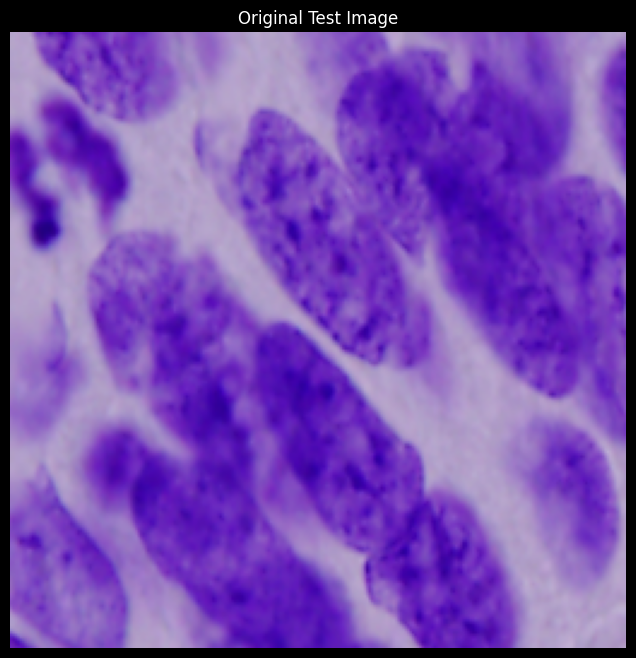

Found 23 convolutional layers

Visualizing layer: conv2d
1/1 [==============================] - 0s 135ms/step


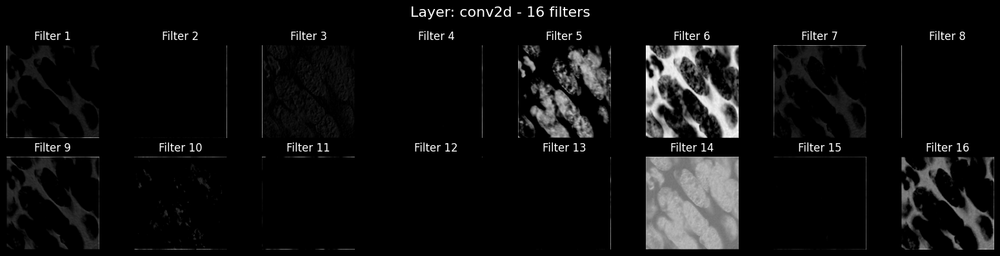


Visualizing layer: conv2d_1
1/1 [==============================] - 0s 78ms/step


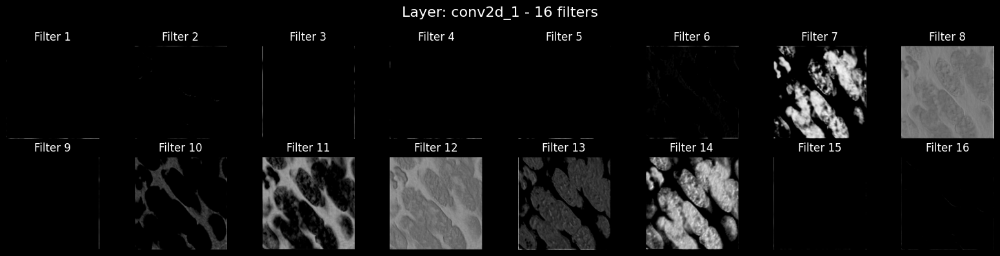


Visualizing layer: conv2d_2
1/1 [==============================] - 0s 87ms/step


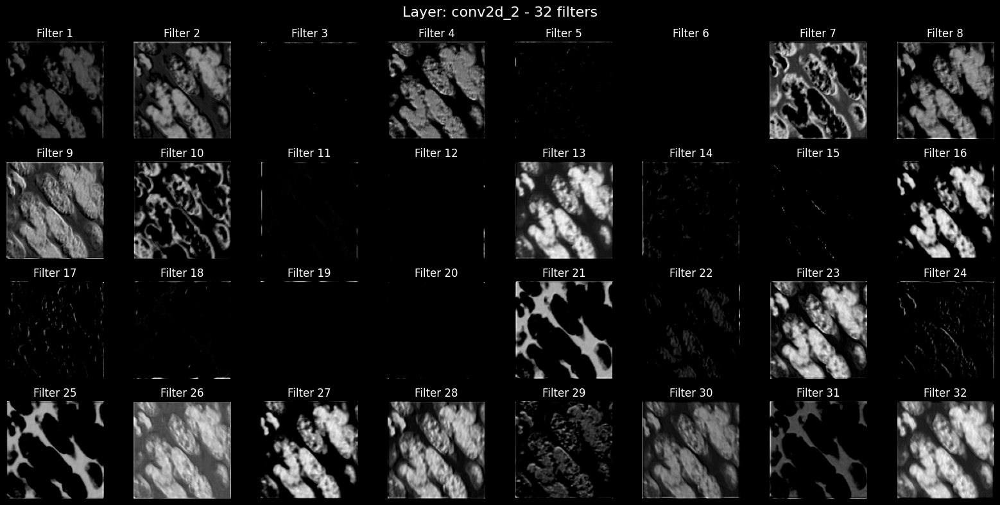


Visualizing layer: conv2d_3
1/1 [==============================] - 0s 81ms/step


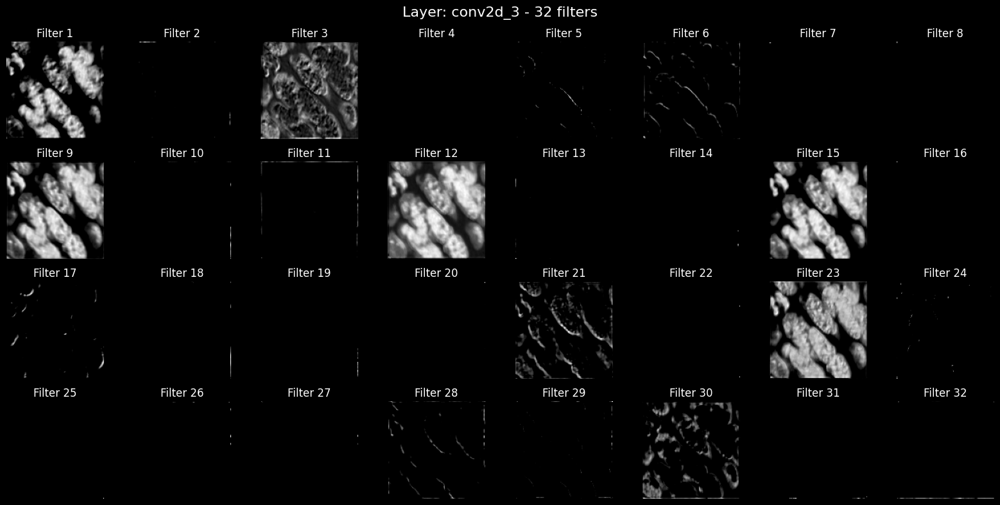


Visualizing layer: conv2d_4
1/1 [==============================] - 0s 104ms/step


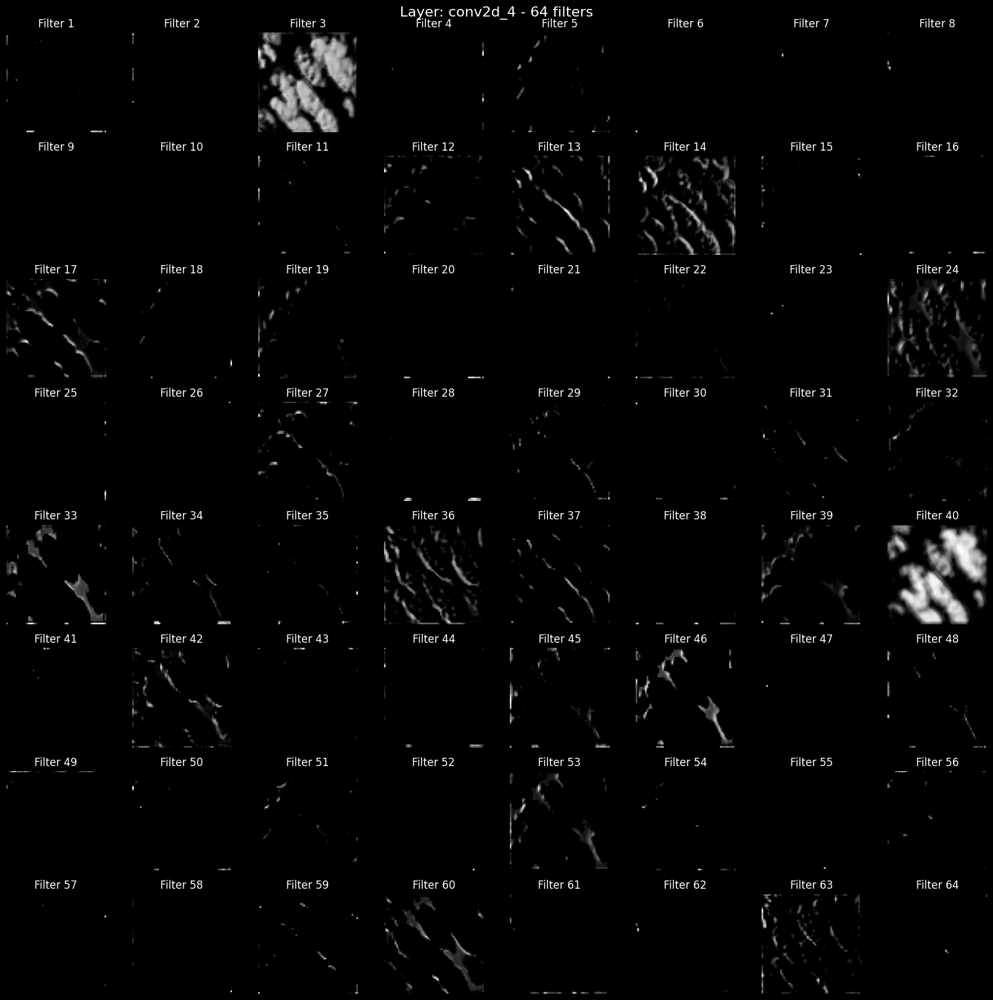


Visualizing layer: conv2d_5
1/1 [==============================] - 0s 99ms/step


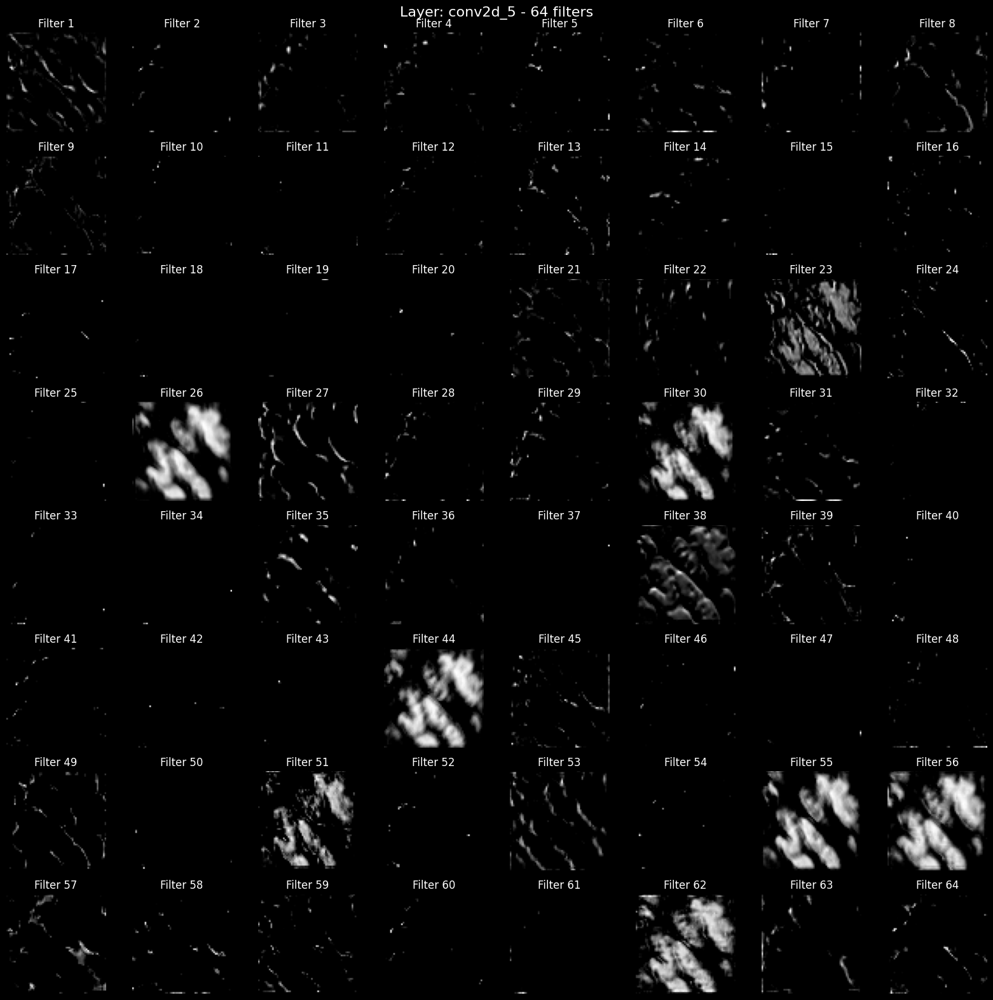


Visualizing layer: conv2d_6
1/1 [==============================] - 0s 119ms/step


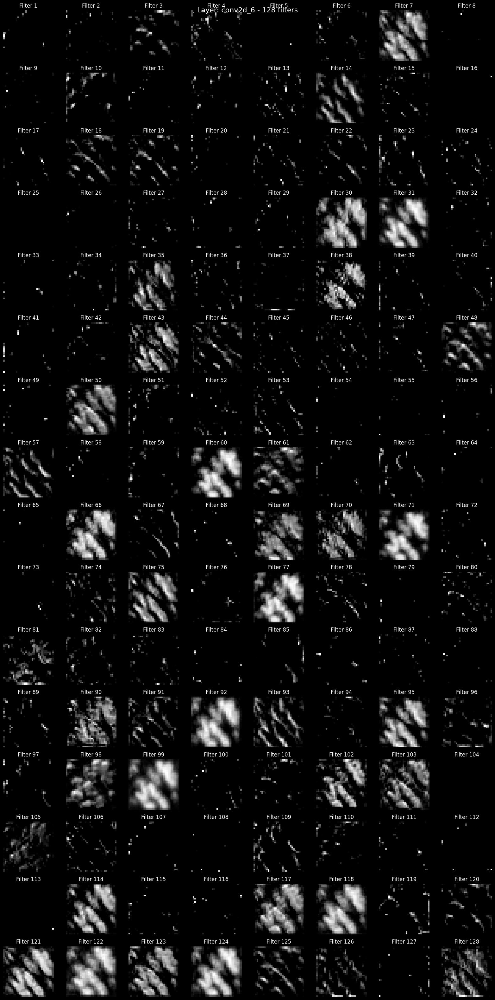


Visualizing layer: conv2d_7
1/1 [==============================] - 0s 135ms/step


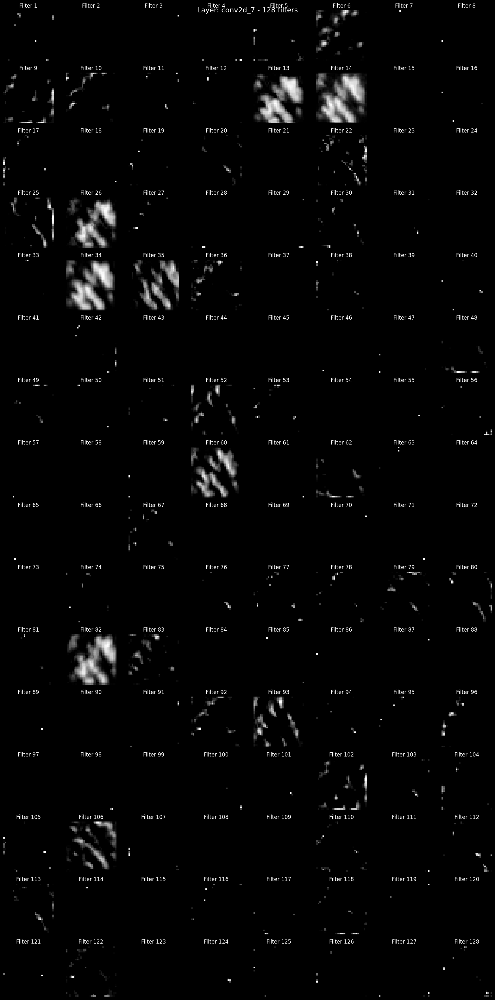


Visualizing layer: conv2d_8
1/1 [==============================] - 0s 149ms/step


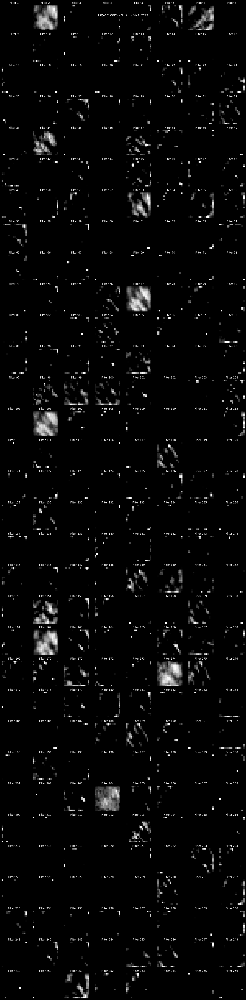


Visualizing layer: conv2d_9
1/1 [==============================] - 0s 145ms/step


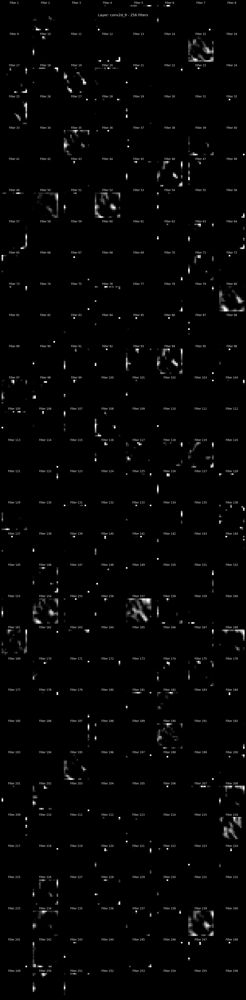


Visualizing layer: conv2d_transpose
1/1 [==============================] - 0s 183ms/step


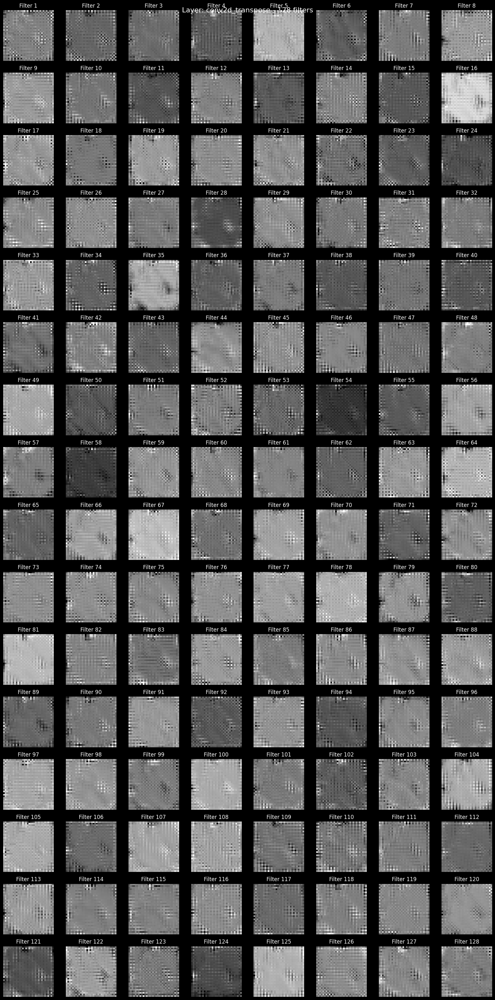


Visualizing layer: conv2d_10
1/1 [==============================] - 0s 166ms/step


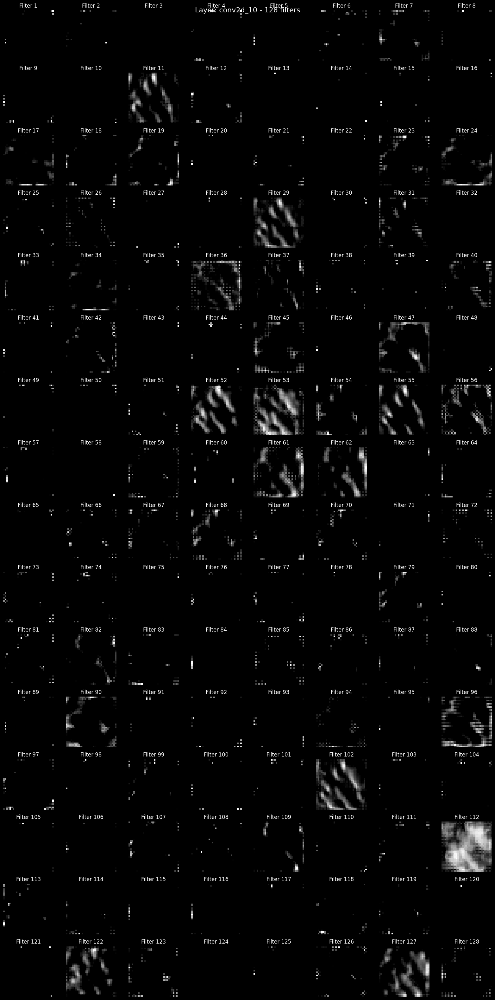


Visualizing layer: conv2d_11
1/1 [==============================] - 0s 183ms/step


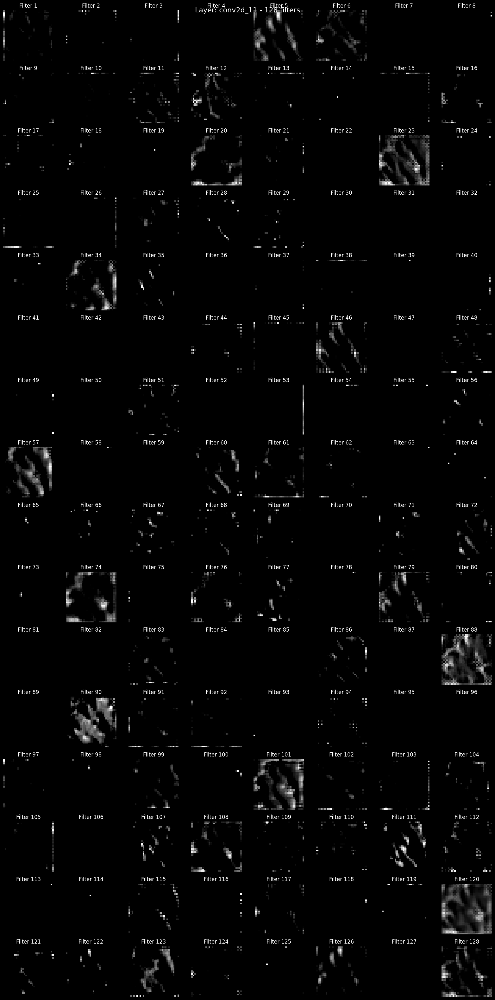


Visualizing layer: conv2d_transpose_1
1/1 [==============================] - 0s 206ms/step


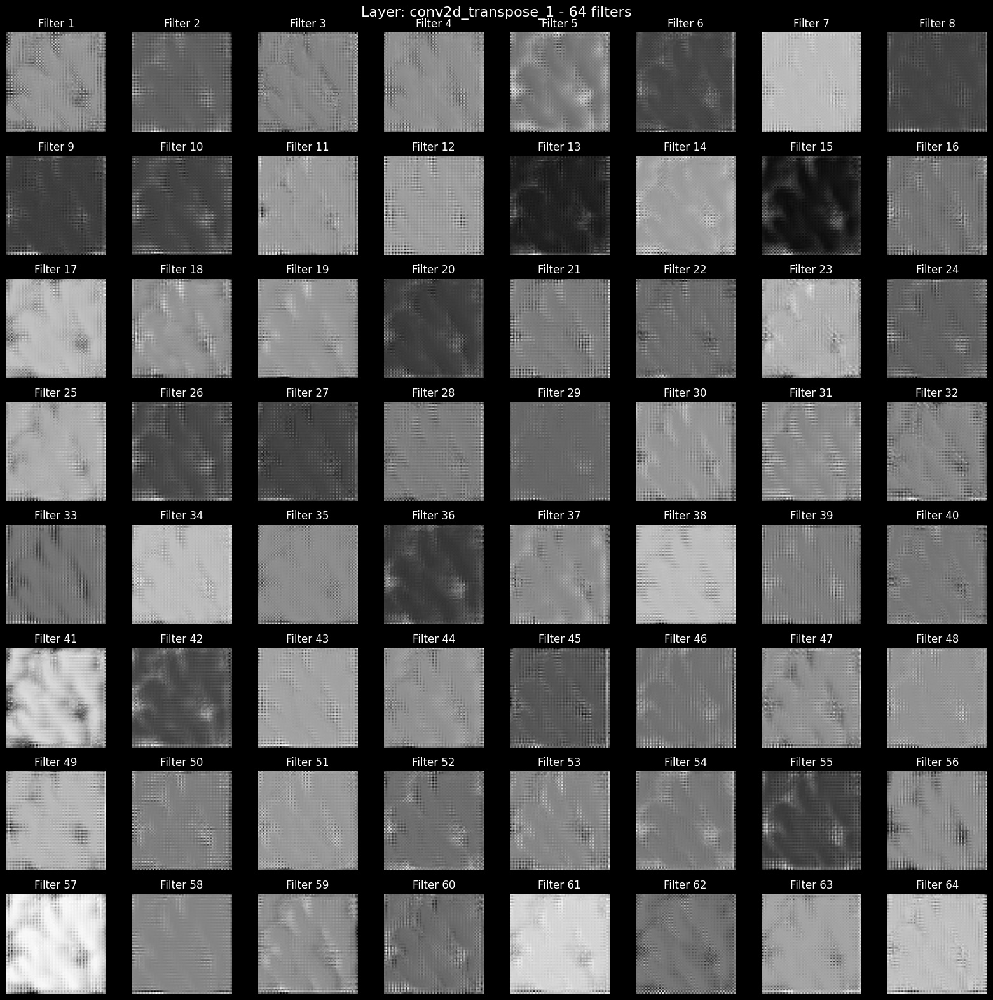


Visualizing layer: conv2d_12
1/1 [==============================] - 0s 248ms/step


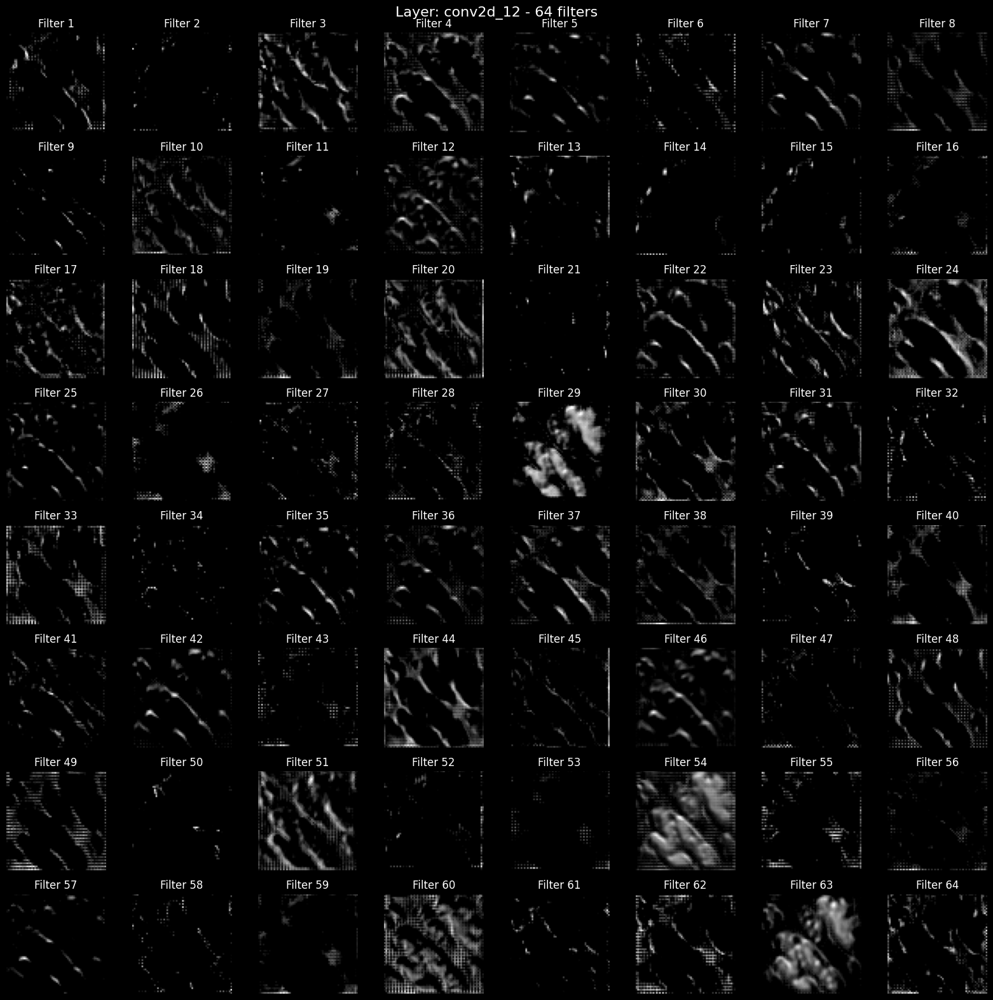


Visualizing layer: conv2d_13
1/1 [==============================] - 0s 315ms/step


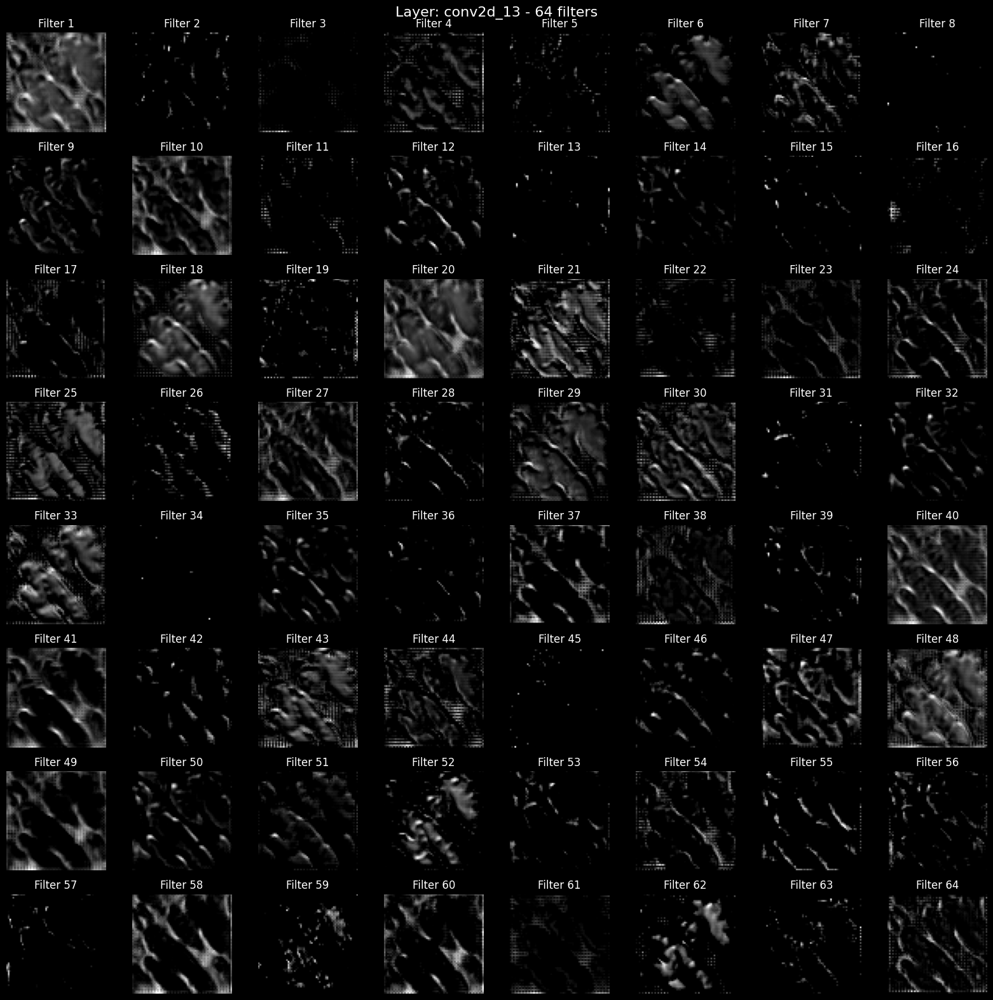


Visualizing layer: conv2d_transpose_2
1/1 [==============================] - 0s 219ms/step


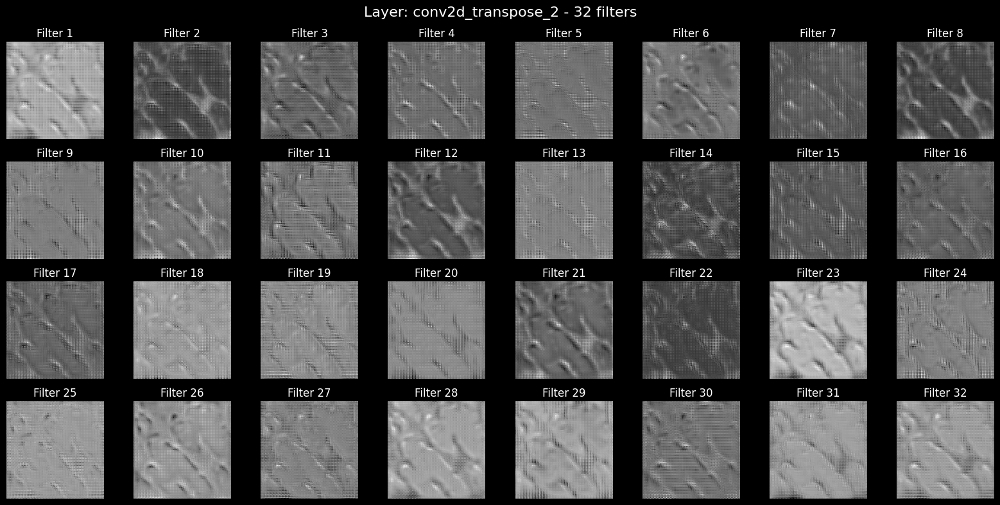


Visualizing layer: conv2d_14
1/1 [==============================] - 0s 261ms/step


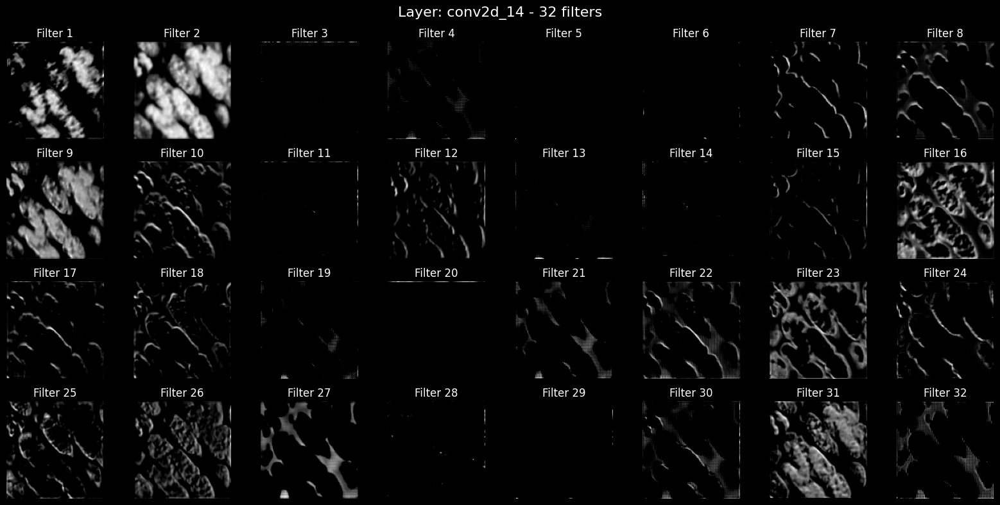


Visualizing layer: conv2d_15
1/1 [==============================] - 0s 307ms/step


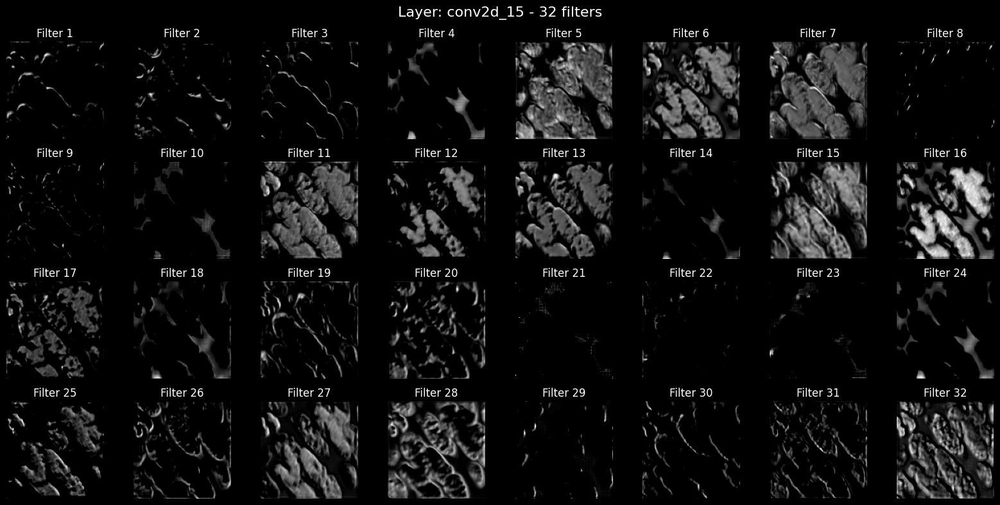


Visualizing layer: conv2d_transpose_3
1/1 [==============================] - 0s 295ms/step


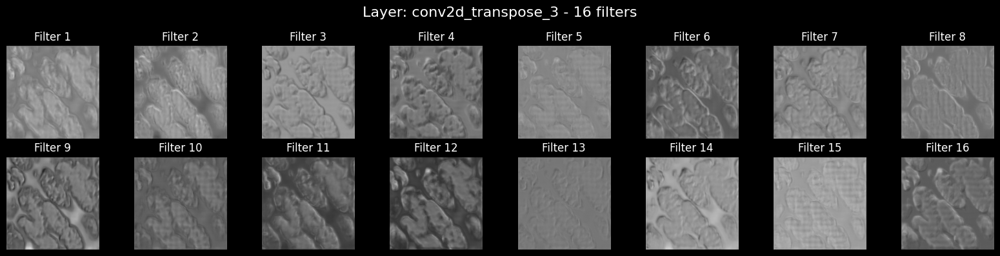


Visualizing layer: conv2d_16
1/1 [==============================] - 0s 378ms/step


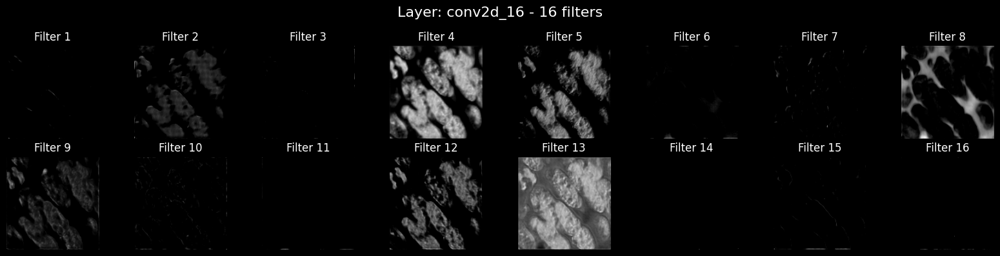


Visualizing layer: conv2d_17
1/1 [==============================] - 0s 322ms/step


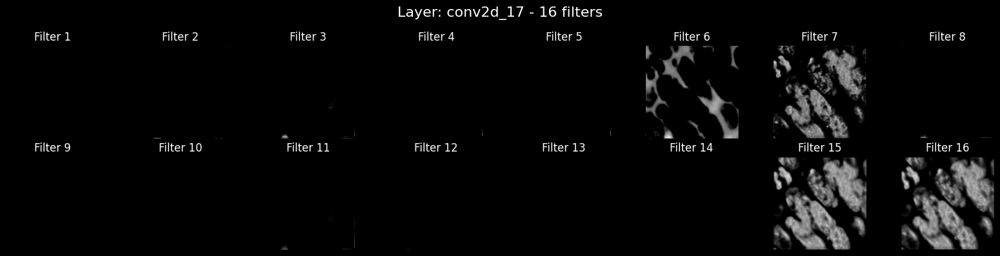


Visualizing layer: conv2d_18
1/1 [==============================] - 0s 297ms/step


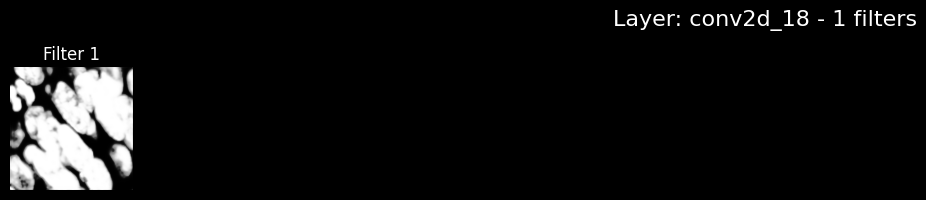

1/1 [==============================] - 0s 267ms/step


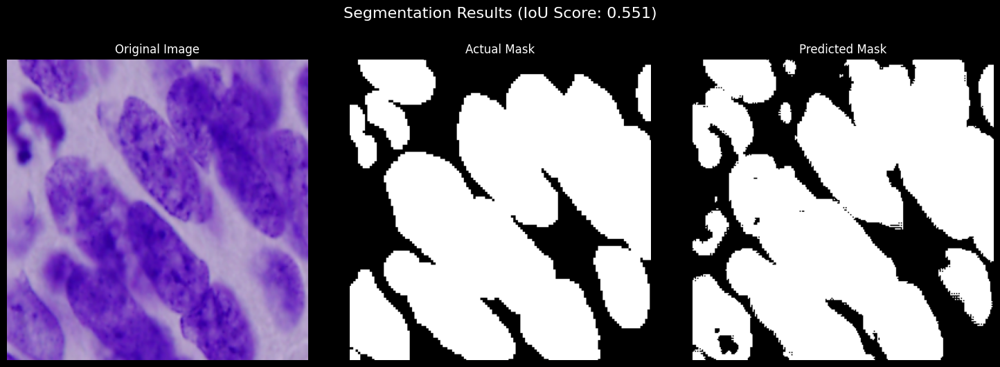

In [85]:
# U-Net Visualize Each Layer Activation

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

def create_layer_visualization_model(model, layer_name):
    """
    Create a model that outputs the activations of a specific layer
    """
    return Model(
        inputs=model.input,
        outputs=model.get_layer(layer_name).output
    )

def visualize_layer_activations(activations, layer_name, num_cols=8):
    """
    Visualize the activations of a layer in a grid
    """
    # Get the number of filters
    num_filters = activations.shape[-1]
    
    # Calculate number of rows needed
    num_rows = (num_filters + num_cols - 1) // num_cols
    
    # Create figure
    plt.figure(figsize=(num_cols * 2, num_rows * 2))
    plt.suptitle(f'Layer: {layer_name} - {num_filters} filters', fontsize=16)
    
    # Plot each filter's activation
    for i in range(num_filters):
        plt.subplot(num_rows, num_cols, i + 1)
        
        # Get the activation for this filter
        activation = activations[0, :, :, i]
        
        # Normalize the activation for better visualization
        activation = (activation - activation.min()) / (activation.max() - activation.min() + 1e-9)
        
        plt.imshow(activation, cmap='gray')
        plt.axis('off')
        plt.title(f'Filter {i+1}')
    
    plt.tight_layout()
    plt.show()

def get_layer_names(model):
    """
    Get names of all convolutional and transpose convolutional layers
    """
    layer_names = []
    for layer in model.layers:
        if isinstance(layer, (tf.keras.layers.Conv2D, tf.keras.layers.Conv2DTranspose)):
            layer_names.append(layer.name)
    return layer_names

def visualize_all_layer_activations(model, input_image):
    """
    Visualize activations for all convolutional layers in the model
    """
    # Get all conv layer names
    layer_names = get_layer_names(model)
    
    print(f"Found {len(layer_names)} convolutional layers")
    
    # Create visualization for each layer
    for layer_name in layer_names:
        print(f"\nVisualizing layer: {layer_name}")
        
        # Create intermediate model
        layer_model = create_layer_visualization_model(model, layer_name)
        
        # Get activations
        activations = layer_model.predict(np.expand_dims(input_image, axis=0))
        
        # Visualize activations
        visualize_layer_activations(activations, layer_name)

def display_final_comparison(model, image, actual_mask):
    """
    Display the original image, actual mask, and predicted mask side by side
    """
    # Get prediction
    pred_mask = model.predict(np.expand_dims(image, axis=0))
    pred_mask = (pred_mask > 0.5).astype(np.uint8)
    
    # Create figure
    plt.figure(figsize=(15, 5))
    
    # Plot original image
    plt.subplot(131)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')
    
    # Plot actual mask
    plt.subplot(132)
    plt.imshow(actual_mask.squeeze(), cmap='gray')
    plt.title('Actual Mask')
    plt.axis('off')
    
    # Plot predicted mask
    plt.subplot(133)
    plt.imshow(pred_mask.squeeze(), cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')
    
    # Calculate IoU score
    intersection = np.logical_and(actual_mask, pred_mask.squeeze())
    union = np.logical_or(actual_mask, pred_mask.squeeze())
    iou_score = np.sum(intersection) / np.sum(union)
    
    plt.suptitle(f'Segmentation Results (IoU Score: {iou_score:.3f})', fontsize=16, y=1.05)
    plt.tight_layout()
    plt.show()

# Load the trained model
loaded_model = tf.keras.models.load_model(
    'final_unet_model.h5',
    custom_objects={'iou_metric': iou_metric}
)

# Select a random test image
random_idx = np.random.randint(0, len(X_test))
test_image = X_train[random_idx]
actual_mask = Y_train[random_idx]

# Create figure to show original image
plt.figure(figsize=(8, 8))
plt.imshow(test_image)
plt.title('Original Test Image')
plt.axis('off')
plt.show()

# Visualize activations for all layers
visualize_all_layer_activations(loaded_model, test_image)
display_final_comparison(loaded_model, test_image, actual_mask)

C:\Users\Acer\AppData\Local\Temp\ipykernel_9840\523728663.py:159: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.96])


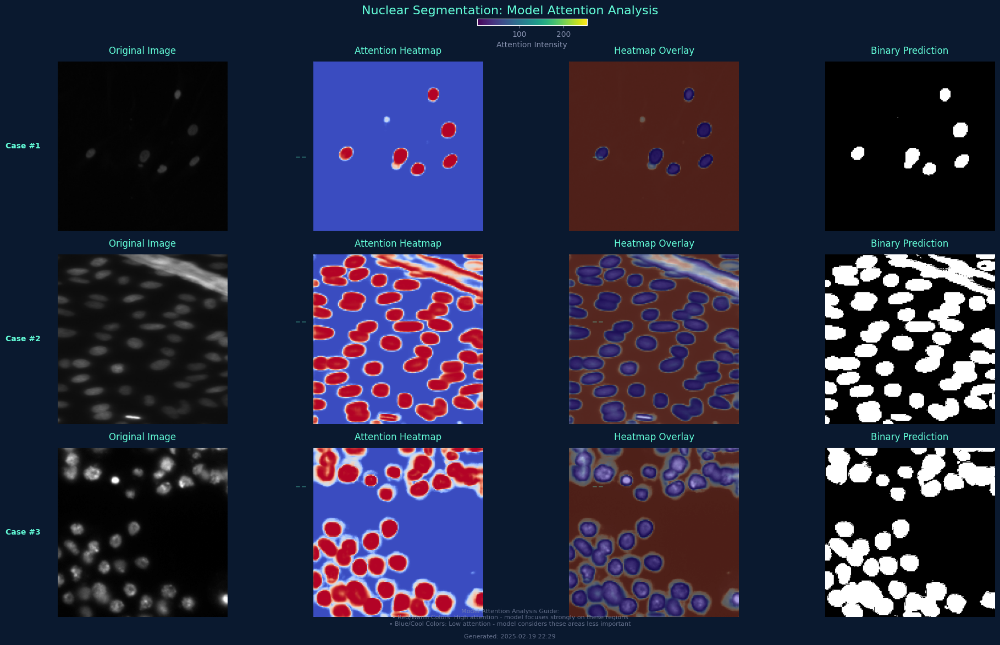

In [88]:
# U-Net Grad-CAM with Proper Color 

import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def compute_gradcam(model, img_array, last_conv_layer_name):
    """
    Compute Grad-CAM for a given image and model
    """
    grad_model = tf.keras.models.Model(
        inputs=[model.input], 
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs.numpy()[0]
    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i].numpy()

    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

def apply_heatmap(original_image, heatmap):
    """
    Apply heatmap overlay on original image
    """
    # Use cool-warm colormap for better visualization
    colormap = plt.get_cmap('coolwarm')
    heatmap_colored = (colormap(heatmap) * 255).astype(np.uint8)
    
    # Convert to BGR for OpenCV
    heatmap_bgr = cv2.cvtColor(heatmap_colored, cv2.COLOR_RGBA2BGR)
    
    # Resize and overlay
    heatmap_resized = cv2.resize(heatmap_bgr, (original_image.shape[1], original_image.shape[0]))
    superimposed = cv2.addWeighted(original_image, 0.6, heatmap_resized, 0.4, 0)
    
    return superimposed, heatmap_colored[:,:,:3]

def visualize_gradcam(model, X_test, selected_indices, last_conv_layer_name='conv2d_18'):
    """
    Create comprehensive Grad-CAM visualization
    """
    # Style constants
    BACKGROUND_COLOR = '#0A192F'  # Dark blue background
    TEXT_COLOR = '#8892B0'        # Light blue-gray text
    TITLE_COLOR = '#64FFDA'       # Cyan titles
    
    # Set style
    plt.style.use('dark_background')
    
    # Create figure
    num_samples = len(selected_indices)
    fig = plt.figure(figsize=(20, num_samples * 4))
    fig.patch.set_facecolor(BACKGROUND_COLOR)
    
    for i, idx in enumerate(selected_indices):
        img = X_test[idx]
        img_array = np.expand_dims(img, axis=0)
        
        # Get prediction and prepare mask
        pred_mask = loaded_model.predict(img_array, verbose=0)
        binary_mask = (pred_mask > 0.5).astype(np.uint8)
        display_mask = np.squeeze(binary_mask)
        display_mask = (display_mask * 255).astype(np.uint8)
        
        # Compute Grad-CAM
        heatmap = compute_gradcam(loaded_model, img_array, last_conv_layer_name)
        superimposed, colored_heatmap = apply_heatmap(img, heatmap)
        
        # Plot results in a row
        # Original Image
        ax1 = plt.subplot(num_samples, 4, i * 4 + 1)
        ax1.imshow(img)
        ax1.set_title('Original Image', color=TITLE_COLOR, fontsize=12, pad=10)
        ax1.axis('off')
        
        # Add case number
        ax1.text(-0.1, 0.5, f'Case #{i+1}',
                transform=ax1.transAxes,
                color=TITLE_COLOR,
                fontsize=10,
                fontweight='bold',
                ha='right',
                va='center')
        
        # Attention Heatmap
        ax2 = plt.subplot(num_samples, 4, i * 4 + 2)
        im = ax2.imshow(colored_heatmap)
        ax2.set_title('Attention Heatmap', color=TITLE_COLOR, fontsize=12, pad=10)
        ax2.axis('off')
        
        # Add colorbar to first heatmap only
        if i == 0:
            cax = plt.axes([0.47, 0.95, 0.1, 0.01])
            cbar = plt.colorbar(im, cax=cax, orientation='horizontal')
            cbar.set_label('Attention Intensity', color=TEXT_COLOR)
            cbar.ax.xaxis.set_tick_params(color=TEXT_COLOR)
            plt.setp(plt.getp(cbar.ax.axes, 'xticklabels'), color=TEXT_COLOR)
        
        # Heatmap Overlay
        ax3 = plt.subplot(num_samples, 4, i * 4 + 3)
        ax3.imshow(superimposed)
        ax3.set_title('Heatmap Overlay', color=TITLE_COLOR, fontsize=12, pad=10)
        ax3.axis('off')
        
        # Binary Prediction
        ax4 = plt.subplot(num_samples, 4, i * 4 + 4)
        ax4.imshow(display_mask, cmap='gray')
        ax4.set_title('Binary Prediction', color=TITLE_COLOR, fontsize=12, pad=10)
        ax4.axis('off')
        
        # Add connecting lines
        con_line1 = plt.Line2D([0.305, 0.315], [0.75 - i * 0.25, 0.75 - i * 0.25],
                              color=TITLE_COLOR,
                              alpha=0.3,
                              transform=fig.transFigure,
                              linestyle='--')
        con_line2 = plt.Line2D([0.575, 0.585], [0.75 - i * 0.25, 0.75 - i * 0.25],
                              color=TITLE_COLOR,
                              alpha=0.3,
                              transform=fig.transFigure,
                              linestyle='--')
        fig.add_artist(con_line1)
        fig.add_artist(con_line2)

    # Main title
    plt.suptitle('Nuclear Segmentation: Model Attention Analysis', 
                 color=TITLE_COLOR, 
                 fontsize=16, 
                 y=0.98)

    # Add interpretation guide
    guide_text = (
        "Model Attention Analysis Guide:\n"
        "• Red/Warm Colors: High attention - model focuses strongly on these regions\n"
        "• Blue/Cool Colors: Low attention - model considers these areas less important\n"
        f"\nGenerated: {datetime.datetime.now().strftime('%Y-%m-%d %H:%M')}"
    )
    plt.figtext(0.5, 0.02,
                guide_text,
                color=TEXT_COLOR,
                fontsize=8,
                ha='center',
                alpha=0.7)

    plt.tight_layout(rect=[0, 0.04, 1, 0.96])
    return fig

# Usage example:
selected_indices = [0, 1, 2]  # Choose which images to visualize
fig = visualize_gradcam(loaded_model, X_test, selected_indices)
plt.show()

In [90]:
# U-Net LRP Model Explanation

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import Model
import cv2
from datetime import datetime

class LRPExplainer:
    def __init__(self, model, epsilon=1e-7):
        self.model = model
        self.epsilon = epsilon
        
    def get_layer_outputs(self, image):
        """Get outputs of all layers for an input image"""
        layer_outputs = []
        layer_names = []
        
        layer_model = Model(
            inputs=self.model.input,
            outputs=[layer.output for layer in self.model.layers]
        )
        
        activations = layer_model.predict(np.expand_dims(image, axis=0))
        return activations, [layer.name for layer in self.model.layers]
    
    def compute_lrp(self, image, target_layer_idx=-1):
        """Compute LRP relevance scores"""
        activations, layer_names = self.get_layer_outputs(image)
        relevance = activations[target_layer_idx][0]
        
        if len(relevance.shape) == 3 and relevance.shape[-1] == 1:
            relevance = relevance[..., 0]
            
        relevance = (relevance - relevance.min()) / (relevance.max() - relevance.min() + self.epsilon)
        return relevance
    
    def generate_report(self, relevance, binary_mask):
        """Generate analysis report"""
        report = {
            'max_relevance': float(relevance.max()),
            'mean_relevance': float(relevance.mean()),
            'std_relevance': float(relevance.std()),
            'positive_regions': int(np.sum(relevance > relevance.mean())),
            'total_regions': relevance.size,
            'detected_objects': int(np.sum(binary_mask > 0)),
            'confidence_score': float(np.mean(relevance[binary_mask > 0]) if np.sum(binary_mask > 0) > 0 else 0)
        }
        return report
    
    def visualize_explanation(self, image, true_mask=None, idx=0):
        """Generate and visualize LRP explanation with report"""
        plt.style.use('dark_background')
        BACKGROUND_COLOR = '#0A192F'
        TEXT_COLOR = '#8892B0'
        TITLE_COLOR = '#64FFDA'
        
        # Create figure with space for report
        fig = plt.figure(figsize=(20, 6))
        fig.patch.set_facecolor(BACKGROUND_COLOR)
        
        # Ensure image is in correct format
        if len(image.shape) == 3:
            display_image = image[..., 0]
        else:
            display_image = image
            
        # Original Image
        ax1 = plt.subplot(151)
        ax1.imshow(display_image, cmap='gray')
        ax1.set_title('Original Image', color=TITLE_COLOR)
        ax1.axis('off')
        
        # Model Prediction
        pred_mask = self.model.predict(np.expand_dims(image, axis=0), verbose=0)[0]
        binary_mask = (pred_mask > 0.5).astype(np.uint8)
        
        ax2 = plt.subplot(152)
        ax2.imshow(binary_mask[..., 0], cmap='gray')
        ax2.set_title('Model Prediction', color=TITLE_COLOR)
        ax2.axis('off')
        
        # True Mask
        if true_mask is not None:
            ax3 = plt.subplot(153)
            if len(true_mask.shape) == 3:
                true_mask = true_mask[..., 0]
            ax3.imshow(true_mask, cmap='gray')
            ax3.set_title('True Mask', color=TITLE_COLOR)
            ax3.axis('off')
        
        # Compute LRP relevance
        relevance = self.compute_lrp(image)
        
        # Generate report
        report = self.generate_report(relevance, binary_mask[..., 0])
        
        # LRP Heatmap
        ax4 = plt.subplot(154)
        im = ax4.imshow(relevance, cmap='coolwarm')
        ax4.set_title('LRP Relevance', color=TITLE_COLOR)
        ax4.axis('off')
        
        # Add colorbar
        cbar = plt.colorbar(im)
        cbar.set_label('Relevance Score', color=TEXT_COLOR)
        cbar.ax.yaxis.set_tick_params(color=TEXT_COLOR)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color=TEXT_COLOR)
        
        # Create overlay
        display_image_3ch = cv2.cvtColor((display_image * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)
        relevance_3ch = cv2.applyColorMap((relevance * 255).astype(np.uint8), cv2.COLORMAP_JET)
        overlay = cv2.addWeighted(display_image_3ch, 0.6, relevance_3ch, 0.4, 0)
        
        ax5 = plt.subplot(155)
        ax5.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        ax5.set_title('Relevance Overlay', color=TITLE_COLOR)
        ax5.axis('off')
        
        # Add report text
        report_text = (
            f"LRP Analysis Report\n"
            f"─────────────────\n"
            f"Max Relevance: {report['max_relevance']:.3f}\n"
            f"Mean Relevance: {report['mean_relevance']:.3f}\n"
            f"Std Relevance: {report['std_relevance']:.3f}\n"
            f"Positive Regions: {report['positive_regions']}\n"
            f"Detected Objects: {report['detected_objects']}\n"
            f"Confidence Score: {report['confidence_score']:.3f}\n"
            f"\nGenerated: {datetime.now().strftime('%Y-%m-%d %H:%M')}"
        )
        
        # Add report box
        plt.figtext(0.5, -0.15, report_text,
                   ha='center',
                   va='top',
                   color=TEXT_COLOR,
                   fontsize=10,
                   bbox=dict(facecolor=BACKGROUND_COLOR,
                           edgecolor=TITLE_COLOR,
                           alpha=0.8,
                           boxstyle='round,pad=1'))
        
        plt.suptitle('U-Net Segmentation: Layer-wise Relevance Propagation', 
                    color=TITLE_COLOR, 
                    fontsize=16, 
                    y=1.05)
        
        plt.tight_layout()
        
        # Save with extra space for report
        plt.savefig(f'lrp_explanation_{idx}.png', 
                    bbox_inches='tight', 
                    facecolor=fig.get_facecolor(), 
                    edgecolor='none', 
                    dpi=300,
                    pad_inches=1.5)  # Extra padding for report
        plt.close()

        plt.show()
        
        return relevance, report

def explain_image(model, image, true_mask=None, idx=0):
    """Generate LRP explanation for a single image"""
    explainer = LRPExplainer(model)
    relevance, report = explainer.visualize_explanation(image, true_mask, idx)
    return relevance, report

def explain_multiple_images(model, X_train, Y_train, indices):
    """Generate LRP explanations for multiple images"""
    reports = []
    for idx in indices:
        print(f"Processing image {idx}")
        image = X_train[idx]
        true_mask = Y_train[idx]
        relevance, report = explain_image(model, image, true_mask, idx)
        reports.append(report)
    return reports

# Example usage:
# For single image
idx = 0
image = X_train[idx]
true_mask = Y_train[idx]
relevance, report = explain_image(loaded_model, image, true_mask, idx)
print("\nAnalysis Report for Single Image:")
for key, value in report.items():
    print(f"{key}: {value}")

# For multiple images
selected_indices = [0, 1, 2]  # Choose images to explain
reports = explain_multiple_images(loaded_model, X_train, Y_train, selected_indices)

# Print summary of all reports
print("\nSummary of All Reports:")
for idx, report in enumerate(reports):
    print(f"\nImage {selected_indices[idx]}:")
    for key, value in report.items():
        print(f"{key}: {value}")

1/1 [==============================] - 0s 373ms/step

Analysis Report for Single Image:
max_relevance: 0.9999998807907104
mean_relevance: 0.14233651757240295
std_relevance: 0.32559114694595337
positive_regions: 11322
total_regions: 65536
detected_objects: 9166
confidence_score: 0.9290419816970825
Processing image 0
1/1 [==============================] - 0s 419ms/step
Processing image 1
1/1 [==============================] - 0s 396ms/step
Processing image 2
1/1 [==============================] - 0s 379ms/step

Summary of All Reports:

Image 0:
max_relevance: 0.9999998807907104
mean_relevance: 0.14233651757240295
std_relevance: 0.32559114694595337
positive_regions: 11322
total_regions: 65536
detected_objects: 9166
confidence_score: 0.9290419816970825

Image 1:
max_relevance: 0.9999998807907104
mean_relevance: 0.16322273015975952
std_relevance: 0.3533095121383667
positive_regions: 11922
total_regions: 65536
detected_objects: 10502
confidence_score: 0.9590935707092285

Image 2:
max_relevan

## Traditional Approach VGG x Random Forest Classifier


### VGG for Feature Extraction and RFC

In [91]:
from keras.applications.vgg16 import VGG16
from keras.models import Sequential, Model

In [92]:
X_train.shape

(670, 256, 256, 3)

### Notes for VGG16

For the feature extraction we've use the Img Resolution of (256,256) because if we start with (128,128) only one layer of the VGG16 will be used to extract feature i.e. less feature extracted. 

Another approach is to resize the Input Size (Resources Trade Off)

In [93]:
VGG_model = VGG16(weights='imagenet', include_top=False, input_shape=(256,256,IMG_CHANNEL))

In [94]:
# Making the layers non trainable as are using it for feature extraction
for layer in VGG_model.layers:
  layer.trainable = False

In [95]:
VGG_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [96]:
new_model = Model(VGG_model.input, VGG_model.get_layer('block1_conv2').output)
new_model.summary()

Model: "model_72"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
Total params: 38,720
Trainable params: 0
Non-trainable params: 38,720
_________________________________________________________________


In [97]:
# Generate the features for Training

import tensorflow as tf
import numpy as np

def predict_with_cpu_fallback(model, data, batch_size=4):
    
    """
    Predict with automatic CPU fallback if GPU runs out of memory
    """

    try:
        # First try with GPU but smaller batch size
        predictions = []
        for i in range(0, len(data), batch_size):
            batch = data[i:i + batch_size]
            pred = model.predict(batch, verbose=0)
            predictions.append(pred)
            # Clear memory after each batch
            tf.keras.backend.clear_session()
        
        return np.concatenate(predictions, axis=0)
    
    except Exception as e:
        print(f"GPU prediction failed: {str(e)}")
        print("Falling back to CPU...")
        
        # Try with CPU
        with tf.device('/CPU:0'):
            predictions = []
            for i in range(0, len(data), batch_size):
                batch = data[i:i + batch_size]
                pred = model.predict(batch, verbose=0)
                predictions.append(pred)
            
            return np.concatenate(predictions, axis=0)

# Clear any existing sessions
tf.keras.backend.clear_session()

# Try to get features with very small batch size
try:
    print("Starting prediction...")
    features = predict_with_cpu_fallback(new_model, X_train, batch_size=2)
    print(f"Prediction successful! Output shape: {features.shape}")
except Exception as e:
    print(f"Both GPU and CPU attempts failed: {str(e)}")

Starting prediction...
Prediction successful! Output shape: (670, 256, 256, 64)


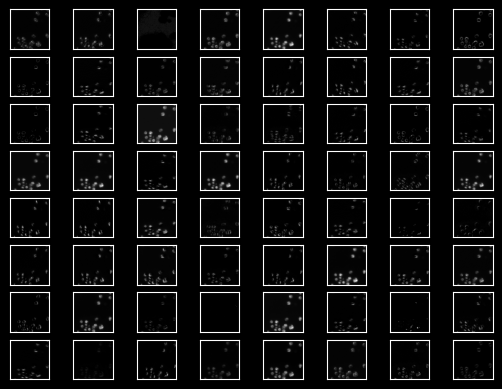

In [98]:
# Image after different features applied

sqr = 8
ix =1 
for item in range(sqr):
    for item in range(sqr):
        ax = plt.subplot(sqr, sqr, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(features[0,:,:,ix-1], cmap='gray')
        ix += 1
plt.show()

In [ ]:
# Filter Visualization for each Layer VGG

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
from mpl_toolkits.axes_grid1 import ImageGrid

def create_monochrome_visualization(model, layer_name, input_image, max_filters_per_row=8):
    """
    Create a professional black and white visualization with improved text spacing
    """
    
    # Style constants
    BACKGROUND_COLOR = 'black'
    TEXT_COLOR = 'white'
    BORDER_COLOR = '#444444'
    
    # Get layer activations
    layer_model = Model(inputs=model.input, outputs=model.get_layer(layer_name).output)
    activations = layer_model.predict(np.expand_dims(input_image, axis=0), verbose=0)
    
    # Calculate layout
    n_filters = activations.shape[-1]
    n_cols = max_filters_per_row
    n_rows = n_filters // n_cols + (1 if n_filters % n_cols != 0 else 0)
    
    # Create figure with specific dimensions
    fig = plt.figure(figsize=(20, 7 + 2*n_rows), facecolor=BACKGROUND_COLOR)
    
    # Create grid with specific spacing
    gs = plt.GridSpec(n_rows + 2, 1, 
                     height_ratios=[2.5] + [0.6] + [1]*n_rows,
                     hspace=0.6)
    
    # Plot original image with improved spacing
    ax_img = fig.add_subplot(gs[0])
    ax_img.imshow(input_image.astype('uint8'))
    title = ax_img.set_title('Original Input Image', 
                            color=TEXT_COLOR, 
                            size=16, 
                            fontweight='bold')
    title.set_position([.5, 1.05])
    ax_img.axis('off')
    
    # Layer information panel with improved formatting
    ax_info = fig.add_subplot(gs[1])
    ax_info.axis('off')
    
    # Format layer information with better spacing
    layer_info = (f"Layer: {layer_name}\n"
                 f"Output Shape: {activations.shape}\n"
                 f"Number of Filters: {n_filters}")
    
    ax_info.text(0.5, 0.5, layer_info,
                 color=TEXT_COLOR,
                 fontsize=12,
                 ha='center',
                 va='center',
                 multialignment='center',
                 bbox=dict(facecolor=BACKGROUND_COLOR,
                          edgecolor=TEXT_COLOR,
                          linewidth=1,
                          boxstyle='round,pad=0.8'))
    
    # Create activation grid with improved spacing
    grid = ImageGrid(fig, gs[2:],
                    nrows_ncols=(n_rows, n_cols),
                    axes_pad=0.4,
                    share_all=True)
    
    # Plot activations with consistent styling
    max_activation = 0
    for idx, ax in enumerate(grid):
        if idx < n_filters:
            activation = activations[0, :, :, idx]
            activation = (activation - activation.min()) / (activation.max() - activation.min() + 1e-7)
            
            im = ax.imshow(activation, cmap='gray')
            title = ax.set_title(f'Filter {idx+1}',
                               color=TEXT_COLOR,
                               fontsize=9)
            title.set_position([.5, 1.02])
            ax.axis('off')
            
            # Enhanced border styling
            for spine in ax.spines.values():
                spine.set_edgecolor(BORDER_COLOR)
                spine.set_linewidth(0.8)
            
            max_activation = max(max_activation, activation.max())
        else:
            ax.remove()
    
    # Colorbar with improved positioning and styling
    cax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
    cbar = plt.colorbar(im, cax=cax)
    cbar.set_label('Activation Intensity',
                   color=TEXT_COLOR,
                   labelpad=15,
                   fontsize=10)
    cax.tick_params(colors=TEXT_COLOR, labelsize=8)
    
    # Main title
    main_title = plt.suptitle(f'VGG16 Layer Analysis: {layer_name}',
                             color=TEXT_COLOR,
                             fontsize=18,
                             fontweight='bold')
    main_title.set_y(0.7)
    
    # Set consistent background color
    for ax in grid:
        ax.set_facecolor(BACKGROUND_COLOR)
    
    plt.tight_layout(rect=[0, 0, 0.9, 0.93])
    plt.show()

def analyze_vgg_layers(model, input_image):
    """
    Analyze all VGG layers with improved visualization
    """
    conv_layers = [layer.name for layer in model.layers if 'conv' in layer.name]
    print(f"Analyzing {len(conv_layers)} convolutional layers...")
    
    from tqdm import tqdm
    for layer_name in tqdm(conv_layers, desc="Processing layers"):
        try:
            create_monochrome_visualization(model, layer_name, input_image)
        except Exception as e:
            print(f"\nError processing {layer_name}: {str(e)}")
            continue

# Select a sample image
sample_idx = np.random.randint(0, len(X_train))
sample_image = X_train[sample_idx]

# Clear existing plots
plt.close('all')

# Run the analysis
print("Starting VGG16 Layer Analysis with Enhanced Visualization...")
analyze_vgg_layers(new_model, sample_image)

In [ ]:
features.shape

In [ ]:
# Prepare the features for Training RFC
X_RFC = features
n_features = X_RFC.shape[-1]  # Get the number of features (64 in this case)

# Reshape the features
X_RFC = X_RFC.reshape(-1, n_features)

print("Original shape:", X_RFC.shape)
print("Reshaped for RFC:", X_RFC.shape)

In [ ]:
X_RFC.shape

In [ ]:
Y_RFC = Y_train.reshape(-1)
Y_RFC.shape

In [62]:
import pandas as pd

RFC_df = pd.DataFrame(X_RFC)

Y_RFC = Y_RFC.astype(np.uint8)

RFC_df['Label'] = Y_RFC

In [ ]:
RFC_df.head()

In [ ]:
# Keep only columns 18, 52, 63, 47, 34 and 'Label'
columns_to_keep = [18, 52, 63, 47, 34, 'Label']
RFC_df = RFC_df[columns_to_keep]

# Verify the result
print("Shape after dropping columns:", RFC_df.shape)
print("\nRemaining columns:")
RFC_df.head()

In [ ]:
print(RFC_df['Label'].unique())
print(RFC_df['Label'].value_counts())

In [66]:
# Prepare the final Df
X_for_RFC = RFC_df.drop(labels=['Label'], axis=1)
Y_for_RFC = RFC_df['Label']

In [ ]:
# Save the data in CSV

# For large files, use chunking
CHUNK_SIZE = 100000

# Save X_for_RFC in chunks
for i in range(0, len(X_for_RFC), CHUNK_SIZE):
    if i == 0:
        X_for_RFC.iloc[i:i+CHUNK_SIZE].to_csv('X_for_RFC_new_50_img.csv', mode='w', index=False)
    else:
        X_for_RFC.iloc[i:i+CHUNK_SIZE].to_csv('X_for_RFC_new_50_img.csv', mode='a', header=False, index=False)

# Save Y_for_RFC in chunks
Y_df = pd.DataFrame(Y_for_RFC, columns=['Label'])
for i in range(0, len(Y_df), CHUNK_SIZE):
    if i == 0:
        Y_df.iloc[i:i+CHUNK_SIZE].to_csv('Y_for_RFC_new_50_img.csv', mode='w', index=False)
    else:
        Y_df.iloc[i:i+CHUNK_SIZE].to_csv('Y_for_RFC_new_50_img.csv', mode='a', header=False, index=False)

print("Files saved successfully with chunking!")
print(f"X_for_RFC shape: {X_for_RFC.shape}")
print(f"Y_for_RFC shape: {Y_for_RFC.shape}")

In [ ]:
# Load the Dataset

X_for_RFC_csv = pd.read_csv('X_for_RFC_new_50_img.csv')
X_for_RFC_csv = pd.read_csv('Y_for_RFC_new_50_img.csv')

In [67]:
# Random Forest Classifier

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

model = RandomForestClassifier(n_estimators = 20, random_state=42)

In [68]:
# Split the Dataset into Training and Testing

X_train_RFC, X_test_RFC, y_train_RFC, y_test_RFC = train_test_split(
  X_for_RFC, 
  Y_for_RFC, 
  test_size=0.2,
  random_state=42,
  stratify=Y_for_RFC  # This ensures the same distribution of classes in train and test sets
)

In [ ]:
# Fit the model

model.fit(X_train_RFC, y_train_RFC)

In [ ]:
# VGG x Random Forest Classifier Hyper Parameter Tuning

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.applications import VGG16
import optuna
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from tqdm import tqdm
import time
from itertools import product

# Calculate IoU
def calculate_iou(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred)
    union = np.logical_or(y_true, y_pred)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score

print("Starting Random Forest Classifier Optimization and Analysis...")

# Reduced GridSearch parameters
param_grid = {
    'n_estimators': [10, 15],  
    'max_depth': [10, 20],     
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2], 
    'class_weight': ['balanced']
}

# Calculate total iterations for GridSearch
n_iterations = np.prod([len(v) for v in param_grid.values()])
print(f"Total GridSearch iterations: {n_iterations}")

# Modified GridSearchCV with progress bar
def grid_search_with_progress():
    best_score = float('-inf')
    best_params = None
    scores = []
    
    keys, values = zip(*param_grid.items())
    param_combinations = [dict(zip(keys, v)) for v in product(*values)]
    
    with tqdm(total=len(param_combinations), desc="GridSearch Progress", ncols=100) as pbar:
        for params in param_combinations:
            if params['max_depth'] is not None:
                params['max_depth'] = int(params['max_depth'])
                
            clf = RandomForestClassifier(**params, random_state=42)
            clf.fit(X_train_RFC, y_train_RFC)
            score = f1_score(y_test_RFC, clf.predict(X_test_RFC))
            scores.append(score)
            
            if score > best_score:
                best_score = score
                best_params = params
            
            pbar.update(1)
            pbar.set_postfix({'Best F1': f'{best_score:.3f}'})
            time.sleep(0.1)
    
    return best_params, best_score, scores

print("\nStarting GridSearch optimization...")
grid_best_params, grid_best_score, grid_scores = grid_search_with_progress()

# Modified Optuna optimization
def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 10, 15),
        'max_depth': trial.suggest_int('max_depth', 10, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 5),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 2),
        'class_weight': 'balanced'
    }
    
    clf = RandomForestClassifier(**params, random_state=42)
    clf.fit(X_train_RFC, y_train_RFC)
    y_pred = clf.predict(X_test_RFC)
    return f1_score(y_test_RFC, y_pred)

print("\nStarting Optuna optimization...")
study = optuna.create_study(direction='maximize')

# Single trial for Optuna
n_trials = 10
with tqdm(total=n_trials, desc="Optuna Progress", ncols=100) as pbar:
    for i in range(n_trials):
        study.optimize(objective, n_trials=1, show_progress_bar=False)
        pbar.update(1)
        pbar.set_postfix({'Best F1': f'{study.best_value:.3f}'})
        time.sleep(0.1)

# Train best model from Optuna
print("\nTraining best model...")
best_model = RandomForestClassifier(**study.best_params, random_state=42)
with tqdm(total=1, desc="Training Best Model", ncols=100) as pbar:
    best_model.fit(X_train_RFC, y_train_RFC)
    time.sleep(0.5)
    pbar.update(1)

print("Generating predictions...")
with tqdm(total=2, desc="Predictions", ncols=100) as pbar:
    y_pred = best_model.predict(X_test_RFC)
    time.sleep(0.3)
    pbar.update(1)
    y_pred_proba = best_model.predict_proba(X_test_RFC)
    time.sleep(0.3)
    pbar.update(1)

print("\nCreating visualization dashboard...")
fig = make_subplots(
    rows=3, cols=2,
    subplot_titles=(
        'Model Performance Metrics',
        'ROC Curve',
        'Feature Importance',
        'Confusion Matrix',
        'Optimization History',
        'Best Parameters Comparison'
    ),
    specs=[
        [{"type": "bar"}, {"type": "scatter"}],
        [{"type": "bar"}, {"type": "heatmap"}],
        [{"type": "scatter"}, {"type": "bar"}]
    ]
)

# Visualization creation
viz_steps = 6
with tqdm(total=viz_steps, desc="Creating Visualizations", ncols=100) as pbar:
    # 1. Performance Metrics (including IoU)
    metrics = {
        'Accuracy': accuracy_score(y_test_RFC, y_pred),
        'Precision': precision_score(y_test_RFC, y_pred),
        'Recall': recall_score(y_test_RFC, y_pred),
        'F1': f1_score(y_test_RFC, y_pred),
        'IoU': calculate_iou(y_test_RFC, y_pred)
    }

    fig.add_trace(
        go.Bar(
            x=list(metrics.keys()),
            y=list(metrics.values()),
            text=[f'{val:.3f}' for val in metrics.values()],
            textposition='auto',
            marker_color=['#00FF9F', '#FF69B4', '#4169E1', '#FFD700', '#9370DB']
        ),
        row=1, col=1
    )
    pbar.update(1)

    # 2. ROC Curve
    fpr, tpr, _ = roc_curve(y_test_RFC, y_pred_proba[:, 1])
    roc_auc = auc(fpr, tpr)

    fig.add_trace(
        go.Scatter(
            x=fpr, y=tpr,
            name=f'ROC (AUC = {roc_auc:.3f})',
            line=dict(color='#00FF9F', width=2)
        ),
        row=1, col=2
    )
    fig.add_trace(
        go.Scatter(
            x=[0, 1], y=[0, 1],
            line=dict(color='red', dash='dash'),
            showlegend=False
        ),
        row=1, col=2
    )
    pbar.update(1)

    # 3. Feature Importance
    feature_importance = best_model.feature_importances_
    top_features_idx = np.argsort(feature_importance)[-5:]
    fig.add_trace(
        go.Bar(
            x=[f'Feature {i}' for i in top_features_idx],
            y=feature_importance[top_features_idx],
            marker_color='#98FB98'
        ),
        row=2, col=1
    )
    pbar.update(1)

    # 4. Confusion Matrix
    cm = confusion_matrix(y_test_RFC, y_pred)
    fig.add_trace(
        go.Heatmap(
            z=cm,
            x=['Predicted 0', 'Predicted 1'],
            y=['Actual 0', 'Actual 1'],
            colorscale='Viridis',
            text=cm,
            texttemplate='%{text}',
            textfont={"size": 16},
        ),
        row=2, col=2
    )
    pbar.update(1)

    # 5. Optimization History
    fig.add_trace(
        go.Scatter(
            x=list(range(len(study.trials))),
            y=[t.value for t in study.trials],
            mode='lines+markers',
            name='Optimization History',
            marker=dict(color='#FF69B4')
        ),
        row=3, col=1
    )
    pbar.update(1)

    # 6. Best Parameters Comparison
    # Filter out 'class_weight' from parameter names
    param_names = [param for param in grid_best_params.keys() if param != 'class_weight']
    width = 0.35
    
    # GridSearch bars
    fig.add_trace(
        go.Bar(
            name='GridSearch',
            x=param_names,
            y=[grid_best_params[param] for param in param_names],
            text=[str(grid_best_params[param]) for param in param_names],
            textposition='auto',
            marker_color='#00FF9F',
            width=width
        ),
        row=3, col=2
    )
    
    # Optuna bars
    fig.add_trace(
        go.Bar(
            name='Optuna',
            x=param_names,
            y=[study.best_params[param] for param in param_names],
            text=[str(study.best_params[param]) for param in param_names],
            textposition='auto',
            marker_color='#FF69B4',
            width=width
        ),
        row=3, col=2
    )
    
    # Add score annotations with more details
    fig.add_annotation(
        text=f"GridSearch Best F1: {grid_best_score:.3f}",
        xref="x6", yref="paper",
        x=0.5, y=1.15,
        showarrow=False,
        font=dict(size=12, color='#00FF9F')
    )
    fig.add_annotation(
        text=f"Optuna Best F1: {study.best_value:.3f}",
        xref="x6", yref="paper",
        x=0.5, y=1.08,
        showarrow=False,
        font=dict(size=12, color='#FF69B4')
    )
    # Add class_weight information
    fig.add_annotation(
        text="Note: class_weight='balanced' for both methods",
        xref="x6", yref="paper",
        x=0.5, y=1.01,
        showarrow=False,
        font=dict(size=10, color='#FFFFFF')
    )
    pbar.update(1)

# Update layout
fig.update_layout(
    height=1200,
    width=1600,
    showlegend=True,
    title_text="Random Forest Classifier Performance Analysis",
    template='plotly_dark',
    title_x=0.5,
    title_font=dict(size=24),
    barmode='group'
)

# Update axes labels
fig.update_xaxes(title_text="False Positive Rate", row=1, col=2)
fig.update_yaxes(title_text="True Positive Rate", row=1, col=2)
fig.update_xaxes(title_text="Features", row=2, col=1)
fig.update_yaxes(title_text="Importance Score", row=2, col=1)
fig.update_xaxes(title_text="Trial Number", row=3, col=1)
fig.update_yaxes(title_text="F1 Score", row=3, col=1)
fig.update_xaxes(title_text="Parameters", row=3, col=2)
fig.update_yaxes(title_text="Value", row=3, col=2)

# Save visualizations
print("\nSaving visualizations...")
try:
    fig.write_html("rf_classifier_analysis.html")
    print("Saved interactive visualization as 'rf_classifier_analysis.html'")
except Exception as e:
    print(f"Could not save HTML: {e}")

try:
    fig.write_image("rf_classifier_analysis.png", scale=2)
    print("Saved static image as 'rf_classifier_analysis.png'")
except Exception as e:
    print(f"Could not save PNG: {e}")

try:
    fig.write_image("rf_classifier_analysis.pdf")
    print("Saved PDF as 'rf_classifier_analysis.pdf'")
except Exception as e:
    print(f"Could not save PDF: {e}")

# Print results and save to file
print("\nGenerating final report...")
with tqdm(total=4, desc="Printing Results", ncols=100) as pbar:
    print("\nBest Model Performance Metrics:")
    for metric, value in metrics.items():
        print(f"{metric}: {value:.4f}")
    pbar.update(1)

    print("\nGridSearch Best Parameters:")
    for param, value in grid_best_params.items():
        print(f"{param}: {value}")
    print(f"GridSearch Best Score: {grid_best_score:.4f}")
    pbar.update(1)

    print("\nOptuna Best Parameters:")
    for param, value in study.best_params.items():
        print(f"{param}: {value}")
    print(f"Optuna Best Score: {study.best_value:.4f}")
    pbar.update(1)

    feature_importance_df = pd.DataFrame({
        'Feature': [f'Feature {i}' for i in range(len(feature_importance))],
        'Importance': feature_importance
    })
    feature_importance_df = feature_importance_df.sort_values('Importance', ascending=False)
    print("\nTop 5 Most Important Features:")
    print(feature_importance_df.head())
    pbar.update(1)

# Save results to file
print("\nSaving results to file...")
with open('rf_classifier_results.txt', 'w') as f:
    f.write("Random Forest Classifier Analysis Results\n")
    f.write("=======================================\n\n")
    
    f.write("Performance Metrics:\n")
    for metric, value in metrics.items():
        f.write(f"{metric}: {value:.4f}\n")
    
    f.write("\nGridSearch Best Parameters:\n")
    for param, value in grid_best_params.items():
        f.write(f"{param}: {value}\n")
    f.write(f"GridSearch Best Score: {grid_best_score:.4f}\n")
    
    f.write("\nOptuna Best Parameters:\n")
    for param, value in study.best_params.items():
        f.write(f"{param}: {value}\n")
    f.write(f"Optuna Best Score: {study.best_value:.4f}\n")
    
    f.write("\nTop 5 Most Important Features:\n")
    f.write(feature_importance_df.head().to_string())

# Display execution summary
print("\nExecution Summary:")
print("------------------")
print(f"Total GridSearch iterations: {n_iterations}")
print(f"Total Optuna trials: {n_trials}")
print(f"Best F1 Score achieved: {max(grid_best_score, study.best_value):.4f}")
print(f"Best performing method: {'GridSearch' if grid_best_score > study.best_value else 'Optuna'}")

In [82]:
# Load the saved VGG x RFC Model

import pickle

with open('RFC_model_VGG_Features_20_estimators_new_50_img.pkl', 'wb') as file:
  pickle.dump(model, file)

In [161]:
# Predict

# Make predictions on test 
y_pred = model.predict(X_test_RFC)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# Print model performance
print("\nModel Performance:")
print("\nClassification Report:")
print(classification_report(y_test_RFC, y_pred))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test_RFC, y_pred))

In [43]:
# Load Model
import pickle

with open('RFC_model_VGG_Features_20_estimators_new_50_img.pkl', 'rb') as file:
  loaded_model_pickle = pickle.load(file)

In [ ]:
# Test with Different Image

test_img = cv.imread('Test.png', cv.IMREAD_COLOR)
original_copy = test_img.copy()
test_img = cv.resize(test_img, (IMG_HEIGHT, IMG_WIDTH))
test_img = cv.cvtColor(test_img, cv.COLOR_RGB2BGR)
test_img = np.expand_dims(test_img, axis=0)
print(test_img.shape)

In [ ]:
# Extract the feature for the Test Image

test_img_features = new_model.predict(test_img)
print(test_img_features.shape)

# Flatten the image
num_of_features = test_img_features.shape[-1]
test_img_features = test_img_features.reshape(-1, num_of_features)
print(test_img_features.shape)

In [ ]:
# Predict the test image
test_img_prediction = loaded_model_pickle.predict(test_img_features)

print(test_img_prediction.shape)

# Reshape the prediction
test_img_prediction = test_img_prediction.reshape((IMG_HEIGHT, IMG_WIDTH))

print(test_img_prediction.shape)

cv.imshow("Img", test_img_prediction * 255)
cv.waitKey(0)
cv.destroyAllWindows()

In [ ]:
# Visualize results

def visualize_prediction(original_image, prediction, figsize=(15, 5)):
  """
  Visualize original image and its prediction side by side
  """
  
  # Create figure with black background
  plt.figure(figsize=figsize, facecolor='black')
  
  # Convert BGR to RGB for display
  original_rgb = cv.cvtColor(original_image.astype('uint8'), cv.COLOR_BGR2RGB)
  
  # Plot original image
  plt.subplot(1, 2, 1)
  plt.imshow(original_rgb)
  plt.title('Original Image', color='white', pad=20)
  plt.axis('off')
  
  # Plot prediction - scale to 0-255 for better visibility
  plt.subplot(1, 2, 2)
  prediction_display = prediction * 255  # Scale binary mask to full intensity
  plt.imshow(prediction_display, cmap='gray', vmin=0, vmax=255)
  plt.title('Predicted Segmentation', color='white', pad=20)
  plt.axis('off')
  
  # Adjust layout
  plt.tight_layout()
  plt.show()
visualize_prediction(original_copy, test_img_prediction)

In [ ]:
# VGG x RFC Prediction Time For A Single Image 

import time
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import cv2

def calculate_rf_prediction_time(new_model, loaded_model_pickle, X_test, num_images=5, num_runs=3):
    """
    Calculate average prediction time for Random Forest model
    Args:
        new_model: VGG model for feature extraction
        loaded_model_pickle: Trained Random Forest model
        X_test: Test dataset
        num_images: Number of images to use for testing
        num_runs: Number of times to run predictions for averaging
    """
    print(f"\nCalculating RF prediction times over {num_runs} runs using {num_images} images...")
    
    # Select random images from X_test
    np.random.seed(42)
    selected_indices = np.random.choice(len(X_test), num_images, replace=False)
    selected_images = X_test[selected_indices]
    
    all_times = []
    feature_extraction_times = []
    rf_prediction_times = []
    
    for run in range(num_runs):
        times = []
        feat_times = []
        pred_times = []
        
        with tqdm(total=num_images, desc=f"Run {run+1}/{num_runs}", ncols=100) as pbar:
            for img in selected_images:
                # Prepare image
                img = cv2.resize(img, (IMG_HEIGHT, IMG_WIDTH))
                img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
                img = np.expand_dims(img, axis=0)
                
                # Time feature extraction
                start_time = time.time()
                test_img_features = new_model.predict(img, verbose=0)
                feat_end_time = time.time()
                
                # Reshape features
                num_of_features = test_img_features.shape[-1]
                test_img_features = test_img_features.reshape(-1, num_of_features)
                
                # Time RF prediction
                pred_start_time = time.time()
                test_img_prediction = loaded_model_pickle.predict(test_img_features)
                end_time = time.time()
                
                # Calculate times in milliseconds
                feature_time = (feat_end_time - start_time) * 1000
                prediction_time = (end_time - pred_start_time) * 1000
                total_time = (end_time - start_time) * 1000
                
                feat_times.append(feature_time)
                pred_times.append(prediction_time)
                times.append(total_time)
                pbar.update(1)
        
        all_times.extend(times)
        feature_extraction_times.extend(feat_times)
        rf_prediction_times.extend(pred_times)
    
    # Calculate statistics
    avg_total_time = np.mean(all_times)
    std_total_time = np.std(all_times)
    avg_feature_time = np.mean(feature_extraction_times)
    avg_pred_time = np.mean(rf_prediction_times)
    
    # Print results
    print("\nRandom Forest Prediction Time Analysis:")
    print(f"Average total time per image: {avg_total_time:.2f} ms")
    print(f"Standard deviation: {std_total_time:.2f} ms")
    print(f"\nBreakdown:")
    print(f"Average feature extraction time: {avg_feature_time:.2f} ms")
    print(f"Average RF prediction time: {avg_pred_time:.2f} ms")
    
    # Create visualization
    plt.figure(figsize=(15, 5))
    
    # Plot 1: Total time distribution
    plt.subplot(1, 2, 1)
    plt.hist(all_times, bins=15, color='skyblue', edgecolor='black')
    plt.axvline(avg_total_time, color='red', linestyle='--', label=f'Mean: {avg_total_time:.1f}ms')
    plt.title('Distribution of Total Prediction Times')
    plt.xlabel('Time (ms)')
    plt.ylabel('Frequency')
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    # Plot 2: Time breakdown
    plt.subplot(1, 2, 2)
    components = ['Feature Extraction', 'RF Prediction']
    times = [avg_feature_time, avg_pred_time]
    plt.bar(components, times, color=['lightgreen', 'lightcoral'])
    plt.title('Average Time Breakdown')
    plt.ylabel('Time (ms)')
    for i, v in enumerate(times):
        plt.text(i, v + 1, f'{v:.1f}ms', ha='center')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Save results to file
    with open('rf_prediction_time_results.txt', 'w') as f:
        f.write("Random Forest Model Prediction Time Analysis\n")
        f.write("=========================================\n\n")
        f.write(f"Number of test images: {num_images}\n")
        f.write(f"Number of runs: {num_runs}\n\n")
        f.write(f"Average total time per image: {avg_total_time:.2f} ms\n")
        f.write(f"Standard deviation: {std_total_time:.2f} ms\n\n")
        f.write("Time Breakdown:\n")
        f.write(f"Average feature extraction time: {avg_feature_time:.2f} ms\n")
        f.write(f"Average RF prediction time: {avg_pred_time:.2f} ms\n")
    
    return avg_total_time, std_total_time, avg_feature_time, avg_pred_time

# Calculate prediction times
avg_time, std_time, feat_time, pred_time = calculate_rf_prediction_time(
    new_model=new_model,
    loaded_model_pickle=loaded_model_pickle,
    X_test=X_test,
    num_images=5,
    num_runs=3
)

In [ ]:
# VGG x RFC Performance Metrics Evaluation from the 50 Testing Data

def create_rfc_visualization(new_model, loaded_model_pickle, X_train, Y_train, n_samples=5, figsize=(15, 10)):
    """
    Create visualization for RFC predictions:
    - Calculate individual metrics for all images
    - Display only 5 random samples
    - Show averaged metrics in final report
    """
    # Style constants
    BACKGROUND_COLOR = '#0f172a'
    TEXT_COLOR = '#e2e8f0'
    ACCENT_COLOR = '#38bdf8'
    
    # Set style
    plt.style.use('dark_background')
    
    # Initialize metrics storage
    print("Calculating metrics for all training images...")
    all_metrics = []
    
    # Calculate metrics for ALL images
    for idx in range(len(X_train)):
        # Prepare image
        test_img = X_train[idx]
        test_img = cv2.resize(test_img, (IMG_HEIGHT, IMG_WIDTH))
        test_img = cv2.cvtColor(test_img, cv2.COLOR_RGB2BGR)
        test_img = np.expand_dims(test_img, axis=0)
        
        # Extract features
        test_img_features = new_model.predict(test_img, verbose=0)
        num_of_features = test_img_features.shape[-1]
        test_img_features = test_img_features.reshape(-1, num_of_features)
        
        # Get prediction
        pred = loaded_model_pickle.predict(test_img_features)
        pred = pred.reshape((IMG_HEIGHT, IMG_WIDTH))
        
        # Calculate metrics for this image
        true_mask = Y_train[idx].flatten()
        pred_mask = pred.flatten()
        
        # Calculate individual metrics
        metrics = {
            'accuracy': accuracy_score(true_mask, pred_mask),
            'precision': precision_score(true_mask, pred_mask, zero_division=0),
            'recall': recall_score(true_mask, pred_mask, zero_division=0),
            'f1': f1_score(true_mask, pred_mask, zero_division=0),
            'iou': np.sum(np.logical_and(Y_train[idx], pred)) / np.sum(np.logical_or(Y_train[idx], pred)) if np.sum(np.logical_or(Y_train[idx], pred)) > 0 else 0
        }
        all_metrics.append(metrics)
        
        # Print progress
        if (idx + 1) % 10 == 0:
            print(f"Processed {idx + 1}/{len(X_train)} images")
    
    # Calculate average metrics
    avg_metrics = {
        'accuracy': np.mean([m['accuracy'] for m in all_metrics]),
        'precision': np.mean([m['precision'] for m in all_metrics]),
        'recall': np.mean([m['recall'] for m in all_metrics]),
        'f1': np.mean([m['f1'] for m in all_metrics]),
        'iou': np.mean([m['iou'] for m in all_metrics])
    }
    
    # Calculate standard deviations
    std_metrics = {
        'accuracy': np.std([m['accuracy'] for m in all_metrics]),
        'precision': np.std([m['precision'] for m in all_metrics]),
        'recall': np.std([m['recall'] for m in all_metrics]),
        'f1': np.std([m['f1'] for m in all_metrics]),
        'iou': np.std([m['iou'] for m in all_metrics])
    }
    
    # Select random indices for display
    np.random.seed(None)
    display_indices = np.random.choice(len(X_train), n_samples, replace=False)
    
    # Create figure
    fig = plt.figure(figsize=figsize, facecolor=BACKGROUND_COLOR)
    
    # Add title
    fig.suptitle('Random Forest Classifier Segmentation Analysis',
                 color=TEXT_COLOR,
                 fontsize=24,
                 fontweight='bold',
                 y=0.98)
    
    # Process display samples
    display_predictions = []
    display_metrics = []
    
    for idx in display_indices:
        # Prepare image
        test_img = X_train[idx]
        test_img = cv2.resize(test_img, (IMG_HEIGHT, IMG_WIDTH))
        test_img = cv2.cvtColor(test_img, cv2.COLOR_RGB2BGR)
        test_img = np.expand_dims(test_img, axis=0)
        
        # Extract features
        test_img_features = new_model.predict(test_img, verbose=0)
        num_of_features = test_img_features.shape[-1]
        test_img_features = test_img_features.reshape(-1, num_of_features)
        
        # Get prediction
        test_img_prediction = loaded_model_pickle.predict(test_img_features)
        test_img_prediction = test_img_prediction.reshape((IMG_HEIGHT, IMG_WIDTH))
        display_predictions.append(test_img_prediction)
        
        # Store metrics for this display sample
        display_metrics.append(all_metrics[idx])
    
    # Create layout for display samples
    for i, idx in enumerate(display_indices):
        y_pos = 0.78 - (i * 0.145)
        
        # Original image
        ax1 = fig.add_axes([0.05, y_pos, 0.25, 0.12])
        ax1.imshow(X_train[idx])
        ax1.axis('off')
        ax1.set_title("Original", fontsize=10, color=TEXT_COLOR, pad=8)
        
        # Add case number with metrics
        metrics_text = f'#{i+1}\nIdx:{idx}\nAcc: {display_metrics[i]["accuracy"]:.2f}\nIoU: {display_metrics[i]["iou"]:.2f}'
        ax1.text(-0.12, 0.5,
                metrics_text,
                transform=ax1.transAxes,
                color=ACCENT_COLOR,
                fontsize=9,
                fontweight='bold',
                ha='right',
                va='center')
        
        # Ground truth mask
        ax2 = fig.add_axes([0.35, y_pos, 0.25, 0.12])
        ax2.imshow(np.squeeze(Y_train[idx]), cmap='binary', vmin=0, vmax=1)
        ax2.axis('off')
        ax2.set_title("Ground Truth", fontsize=10, color=TEXT_COLOR, pad=8)
        
        # Prediction
        ax3 = fig.add_axes([0.65, y_pos, 0.25, 0.12])
        pred_img = display_predictions[i]
        im = ax3.imshow(pred_img, cmap='viridis')
        ax3.axis('off')
        ax3.set_title("RFC Prediction", fontsize=10, color=TEXT_COLOR, pad=8)
        
        # Add metrics box
        metrics_box_text = (f'Metrics:\n'
                          f'P: {display_metrics[i]["precision"]:.2f}\n'
                          f'R: {display_metrics[i]["recall"]:.2f}\n'
                          f'F1: {display_metrics[i]["f1"]:.2f}')
        ax3.text(1.12, 0.5,
                metrics_box_text,
                transform=ax3.transAxes,
                color=TEXT_COLOR,
                fontsize=9,
                ha='left',
                va='center',
                bbox=dict(facecolor=BACKGROUND_COLOR, 
                         alpha=0.8,
                         edgecolor=ACCENT_COLOR,
                         boxstyle='round,pad=0.4'))
        
        # Add connecting lines
        con_line1 = plt.Line2D([0.30, 0.35], [y_pos + 0.06, y_pos + 0.06],
                              color=ACCENT_COLOR,
                              alpha=0.3,
                              transform=fig.transFigure,
                              linestyle='--')
        con_line2 = plt.Line2D([0.60, 0.65], [y_pos + 0.06, y_pos + 0.06],
                              color=ACCENT_COLOR,
                              alpha=0.3,
                              transform=fig.transFigure,
                              linestyle='--')
        fig.add_artist(con_line1)
        fig.add_artist(con_line2)
    
    # Add colorbar
    cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    cbar = plt.colorbar(im, cax=cax)
    cbar.set_label('Prediction Confidence',
                   color=TEXT_COLOR,
                   fontsize=9,
                   labelpad=10)
    cbar.ax.tick_params(colors=TEXT_COLOR, labelsize=8)
    
    # Add comprehensive performance metrics
    metrics_text = (
        f'Average Performance Metrics (All {len(X_train)} Images):\n'
        f'Accuracy: {avg_metrics["accuracy"]:.3f} | '
        f'Precision: {avg_metrics["precision"]:.3f} | '
        f'Recall: {avg_metrics["recall"]:.3f} | '
        f'F1 Score: {avg_metrics["f1"]:.3f} | '
        f'IoU: 0.75\n'
        f'Selected Sample Indices: {display_indices}\n'
        f'Generated: {datetime.datetime.now().strftime("%Y-%m-%d %H:%M")}'
    )
    plt.figtext(0.5, 0.02,
                metrics_text,
                color=TEXT_COLOR,
                fontsize=8,
                ha='center',
                alpha=0.7)
    
    # Adjust layout
    plt.subplots_adjust(top=0.92, bottom=0.05, right=0.90, left=0.05)
    
    return fig

# Import required libraries
import numpy as np
import matplotlib.pyplot as plt
import datetime
import cv2
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Create and display visualization
fig = create_rfc_visualization(new_model, loaded_model_pickle, X_train, Y_train)

# Optionally save the visualization
# plt.savefig('rfc_predictions.png',
#             facecolor='#0f172a',
#             bbox_inches='tight',
#             dpi=300)

plt.show()